# Analysis of run732HF data

A quick exploratory analysis of run732HF dataset obtained from Victor. 

## Import modules and define functions

In [1]:
%matplotlib inline
import scipy
from scipy import stats as st
import pynbody as pb
from datetime import datetime
from xml.etree.ElementInclude import include
from matplotlib.colors import LogNorm
from matplotlib.pylab import *
from mpl_toolkits.axes_grid1 import make_axes_locatable

model_dir = 'run732HF/'
base_dir = '/home/ubuntu/projects/S2B/models/' + model_dir
image_dir = '/home/ubuntu/projects/S2B/code/images/' + model_dir
param_fname = base_dir + 'run732HF.param'

def Gauss_Hermite(w, n):
    """
    Return the Gauss Hermite function of order n, weights w
    Gerhard MNRAS (1993) 265, 213-230
    Equations 3.1 - 3.7
    @author: Steven Gough-Kelly
    """
    w = np.array(w)
    p = scipy.special.hermite(n, monic=False) #hermite poly1d obj
    norm = np.sqrt((2**(n+1))*np.pi*np.math.factorial(n)) # N_n Eqn 3.1
    return (p(w)/norm) * np.exp( -0.5 * w * w )

def GaussHermiteMoment(v, n):
    v = v[np.isfinite(v)] # remove nans&inf
    if len(v) <= 1: # Added SL speed+error catch
        return np.nan
    v_dash = (v - np.mean(v))/np.std(v) # center on 0, norm width to 1sig
    hn = np.sum(Gauss_Hermite(v_dash, n))
    return np.sqrt(4*np.pi) * hn / len(v)

def bar_align(galaxy, rbar, barfrac = 0.5, zlim=0.5, log=False):
    """
    Aligns the bar of pynbody galaxy simulation with the x-axis assuming the
    galaxy disc is already aligned to the XY plane using the inertial tensor.

    Function does not return any values/object. Pynbody functions effect the
    global variable which stores 'galaxy' so rotations within the functions
    are applied to input variable 'galaxy'.

    Parameters
    ----------
    galaxy : pynbody simulation object
        Galaxy object in the XY plane to be aligned.

    rbar : float
        Bar radius in simulation units e.g. kpc.

    barfrac : float
        Fraction of bar length to calculate the inertial tensor within in
        simulation units e.g. kpc.

    zlim : float
        Vertical limit to calculate intertial tensor within in simulation units
        e.g. kpc. Useful in galaxies with thick discs and weak bars.

    log : Bool
        Flag to output print statements.

    Returns
    -------
    None

    """
    if np.isnan(rbar):
        if log:
            print('* Bar undefined, using 1 kpc')
        rbar = 1.0
    elif rbar*barfrac < 1.:
        rbar = 1
        if log:
            print('* Short Bar, using 1 kpc')
    else:
        rbar = rbar*barfrac
        if log:
            print('* Bar defined, aligning to {} kpc'.format(rbar))

    if log:
        print('* Realigning bar using |z| < {} '.format(zlim))

    zfilt = pb.filt.LowPass('z',zlim)&pb.filt.HighPass('z',-zlim)
    rfilt = pb.filt.LowPass('rxy',rbar)

    x = np.array(galaxy[zfilt&rfilt].star['pos'].in_units('kpc'))[:,0]
    y = np.array(galaxy[zfilt&rfilt].star['pos'].in_units('kpc'))[:,1]
    m = np.array(galaxy.star[zfilt&rfilt]['mass'])

    #Calculate the inertia tensor
    I_yy, I_xx, I_xy = np.sum(m*y**2),np.sum(m*x**2),np.sum(m*x*y)
    I = np.array([[I_yy, -I_xy], [-I_xy, I_xx]])

    #Calculate the eigenvalues and eigenvectors
    eigenvalues, eigenvectors = np.linalg.eig(I)
    lowest = eigenvalues.argmin()
    maj_axis = eigenvectors[:, lowest]

    #Get the angle we need to rotate by
    r_angle = np.degrees(np.arctan2(maj_axis[1], maj_axis[0]))

    galaxy.rotate_z(-r_angle)

    if log:
        print('* Bar realigned by {} degrees'.format(r_angle))

    return None

def pbload(filename, paramname=None, log=False):
    if log:
        print('* Loading data from file', filename, '...')
    if '::' in filename:
        filename, species = filename.split('::')
        sim = pb.load(filename, paramname=paramname)
        sim = getattr(sim, species)
    else:
        sim = pb.load(filename, paramname=paramname)
    if log:
        print('* Centering the data...')
    pb.analysis.angmom.faceon(sim)
    bar_align(sim,3.,barfrac=1.,zlim=0.5,log=log)
    return sim

def list_snaps(base_dir):
    import os
    # list to store files
    lst = []
    # Iterate directory
    for path in os.listdir(base_dir):
        # check if current path is a file
        if os.path.isfile(os.path.join(base_dir, path)) and '.gz' in path:
            lst.append(path)
    return(sorted(lst))

snap_lst = list_snaps(base_dir)
print(snap_lst)


['run732HF.01200.gz', 'run732HF.01210.gz', 'run732HF.01220.gz', 'run732HF.01230.gz', 'run732HF.01240.gz', 'run732HF.01250.gz', 'run732HF.01260.gz', 'run732HF.01270.gz', 'run732HF.01280.gz', 'run732HF.01290.gz', 'run732HF.01300.gz', 'run732HF.01310.gz', 'run732HF.01320.gz', 'run732HF.01330.gz', 'run732HF.01340.gz', 'run732HF.01350.gz', 'run732HF.01360.gz', 'run732HF.01370.gz', 'run732HF.01380.gz', 'run732HF.01390.gz']


## Binned 2d-statistics for number density and velocity

### Number density

#### Load data

In [22]:
# We reload the data to drop effects of prevous manipulations and centre it for face-on view.

s_lst = load_data_lst()

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01320 ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 84.71445997281806 degrees*
Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01330 ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by -159.69278062948806 degrees*
Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01340 ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 145.48701448075272 degrees*


#### Face-on number density

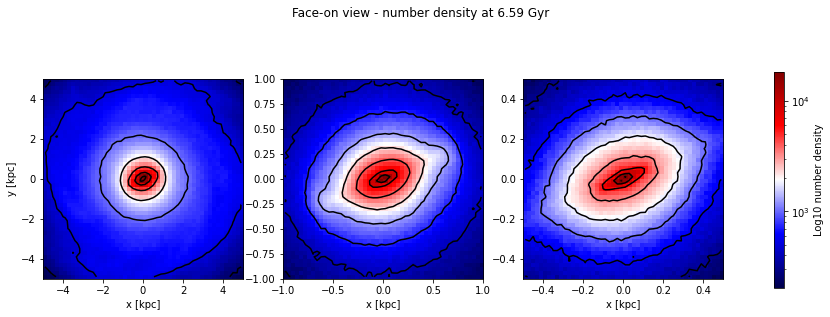

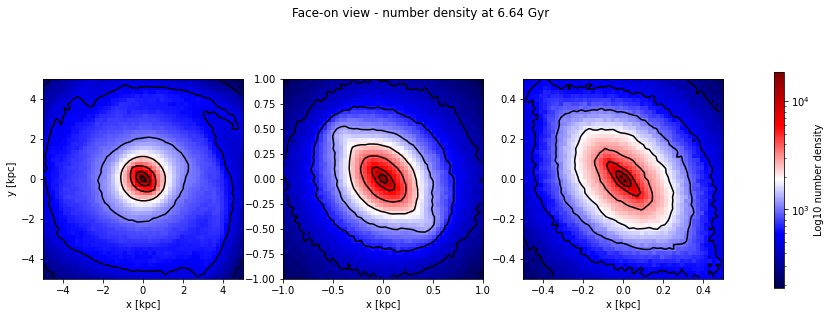

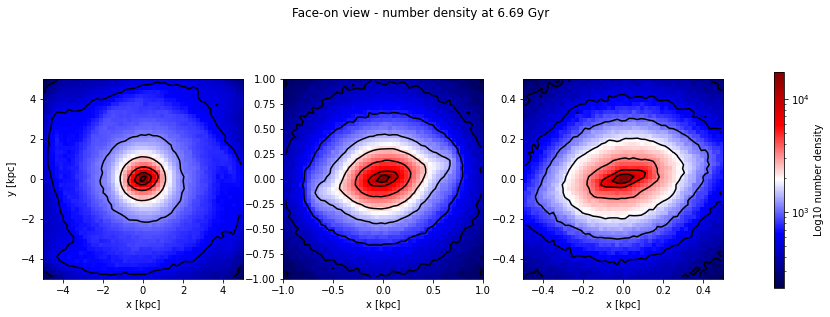

In [20]:
# Zoom in
xy_lim = [[5,5],[1,1],[0.5,0.5]] #kpc
#xlim, ylim = 0.5, 0.5 #kpc
#xlim, ylim = 1, 1 #kpc
#xlim, ylim = 5, 5 #kpc
bins = 50
cmap = 'seismic'
plt_title = 'Face-on view - number density'
cbar_label = 'Log10 number density'

j = 0
for s in s_lst:
    # make the figure and sub plots
    fig,axes = plt.subplots(1,3,figsize=(14,5))
    
    i = 0
    for lim in xy_lim:
        age = round(s.properties['time'].in_units('Gyr'),2)
        xlim, ylim = lim[0], lim[1]
    
        stat2d,xedges,yedges,binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['z'],
                                  statistic = 'count',
                                  range = [[-xlim,xlim],[-ylim,ylim]],
                                  bins = bins)
    
        image = axes[i].imshow(stat2d.T, 
                        origin = 'lower',
                        extent = [-xlim, xlim, -ylim, ylim ],
                        norm = LogNorm(),
                        cmap=cmap)

        #axes[i].title.set_text(str(age) + ' Gyr')

        xcent = (xedges[1:] + xedges[:-1]) / 2
        ycent = (yedges[1:] + yedges[:-1]) / 2
        axes[i].contour(xcent, ycent, np.log10(stat2d.T), colors='k')
    
        i = i + 1

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.2, 0.01, 0.6])
    cbar = fig.colorbar(image, cax = cbar_ax)
    cbar.set_label(cbar_label)
    fig.suptitle(plt_title + ' at ' + str(age) + ' Gyr')
    plt.setp(axes[:], xlabel='x [kpc]')
    plt.setp(axes[0], ylabel='y [kpc]')
    plt.savefig(data_fname_lst[j] + '.png')
    plt.show()
    j = j + 1


#### Inclination 60 deg - number density

Rotate 60 degrees clockwise about X axis for edge-on view.
Calculate the binned 2d statistics and plot.

In [18]:
for s in s_lst:
    s.rotate_x(-60)

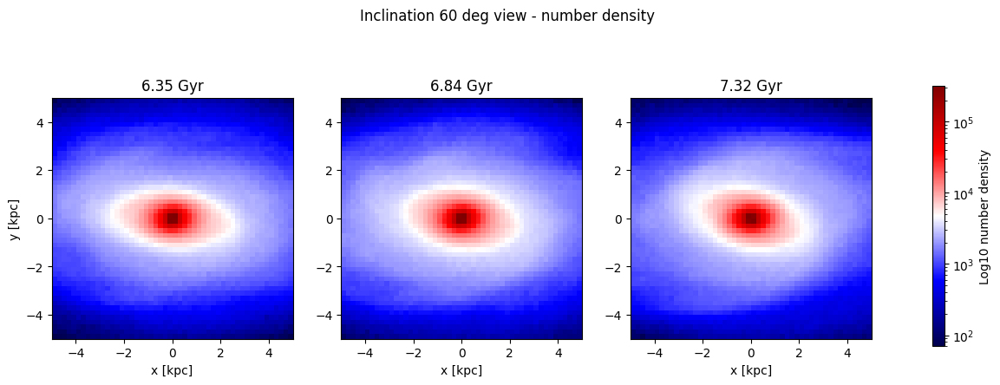

In [19]:
# Zoom in
xlim, ylim = 5, 5 #kpc
bins = 50
cmap = 'seismic'
plt_title = 'Inclination 60 deg view - number density'
cbar_label = 'Log10 number density'

# make the figure and sub plots
fig,axes = plt.subplots(1,3,figsize=(14,5))

i = 0
for s in s_lst:
    age = round(s.properties['time'].in_units('Gyr'),2)
    
    stat2d,xedges,yedges,binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['z'],
                                  statistic = 'count',
                                  range = [[-xlim,xlim],[-ylim,ylim]],
                                  bins = bins)

    image = axes[i].imshow(stat2d.T, 
                        origin = 'lower',
                        extent = [-xlim, xlim, -ylim, ylim ],
                        norm = LogNorm(),
                        cmap=cmap)

    axes[i].title.set_text(str(age) + ' Gyr')
    i = i + 1

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.2, 0.01, 0.6])
cbar = fig.colorbar(image, cax = cbar_ax)
cbar.set_label(cbar_label)
fig.suptitle(plt_title)
plt.setp(axes[:], xlabel='x [kpc]')
plt.setp(axes[0], ylabel='y [kpc]')
plt.show()

#### Edge-on - number density

Rotate 60 + 30 = 90 degrees clockwise about X axis for edge-on view.
Calculate the binned 2d statistics and plot.

In [20]:
for s in s_lst:
    s.rotate_x(-30)

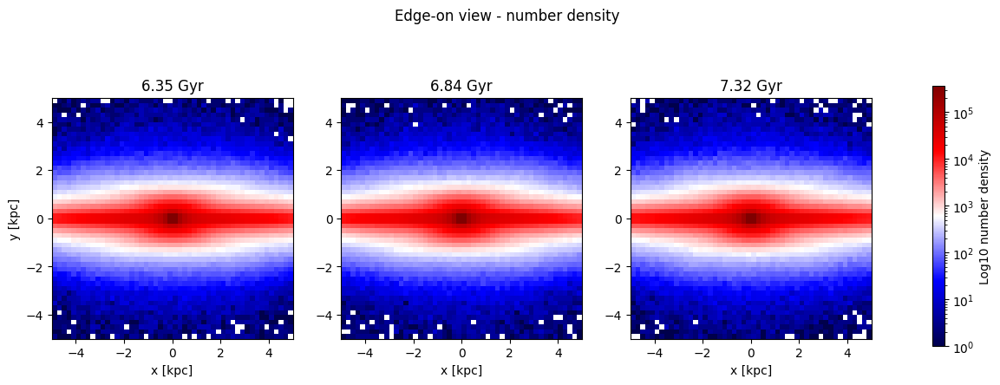

In [21]:
# Zoom in
xlim, ylim = 5, 5 #kpc
bins = 50
cmap = 'seismic'
plt_title = 'Edge-on view - number density'
cbar_label = 'Log10 number density'

stat2d,xedges,yedges,binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['z'],
                              statistic = 'count',
                              range = [[-xlim,xlim],[-ylim,ylim]],
                              bins = bins)

# make the figure and sub plots
fig,axes = plt.subplots(1,3,figsize=(14,5))

i = 0
for s in s_lst:
    age = round(s.properties['time'].in_units('Gyr'),2)
    
    stat2d,xedges,yedges,binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['z'],
                                  statistic = 'count',
                                  range = [[-xlim,xlim],[-ylim,ylim]],
                                  bins = bins)

    image = axes[i].imshow(stat2d.T, 
                        origin = 'lower',
                        extent = [-xlim, xlim, -ylim, ylim ],
                        norm = LogNorm(),
                        cmap=cmap)

    axes[i].title.set_text(str(age) + ' Gyr')
    i = i + 1

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.2, 0.01, 0.6])
cbar = fig.colorbar(image, cax = cbar_ax)
cbar.set_label(cbar_label)
fig.suptitle(plt_title)
plt.setp(axes[:], xlabel='x [kpc]')
plt.setp(axes[0], ylabel='y [kpc]')
plt.show()

#### Face-on - inner bar development

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01200.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 76.86466203656133 degrees*


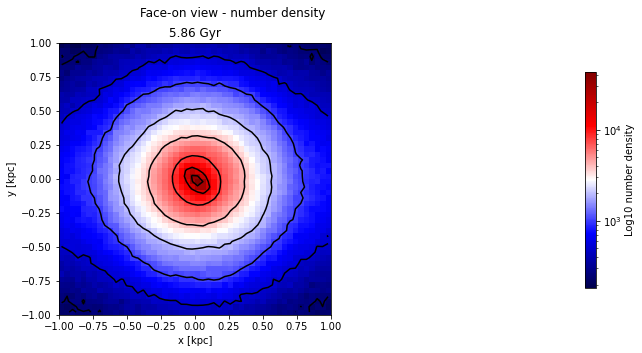

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01210.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 174.599310842863 degrees*


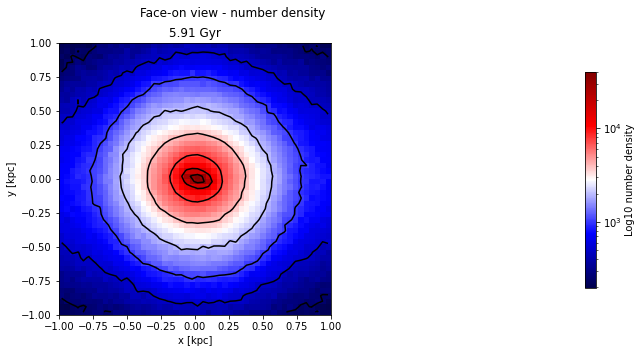

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01220.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 88.64641316008235 degrees*


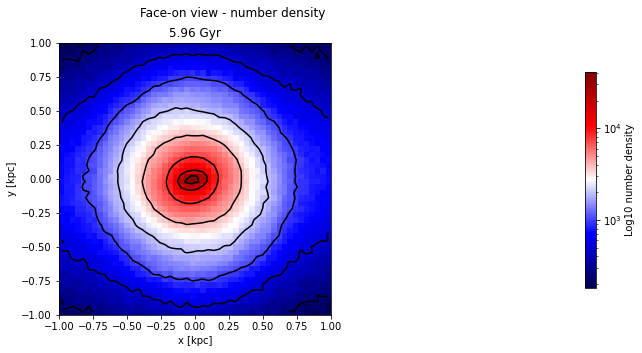

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01230.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by -172.62155486404146 degrees*


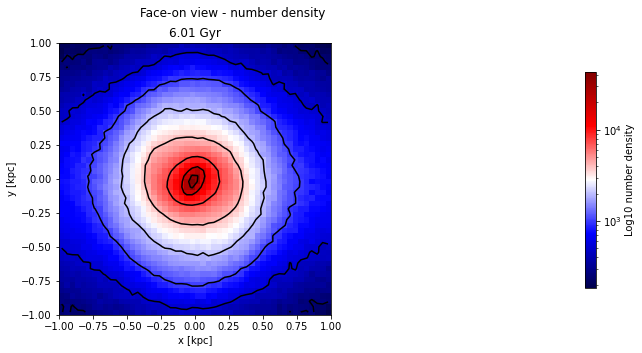

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01240.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 103.69997384566695 degrees*


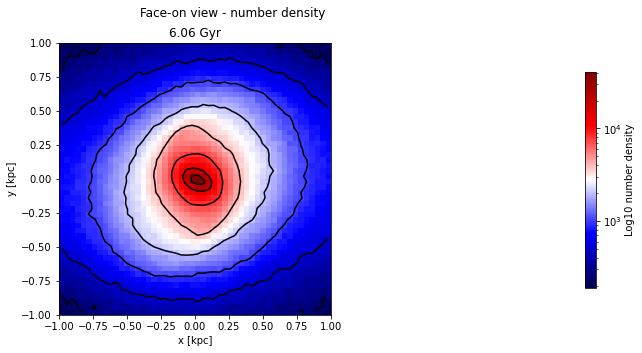

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01250.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by -167.08701143655207 degrees*


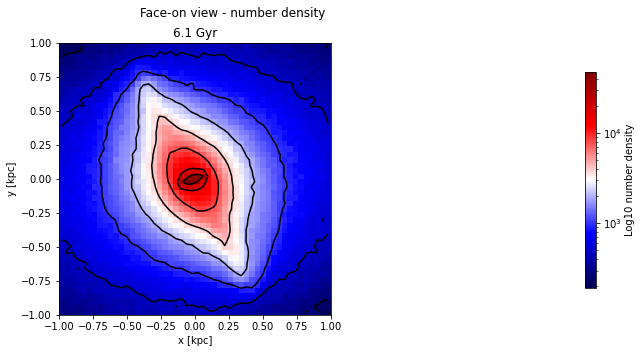

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01260.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 103.18405996483067 degrees*


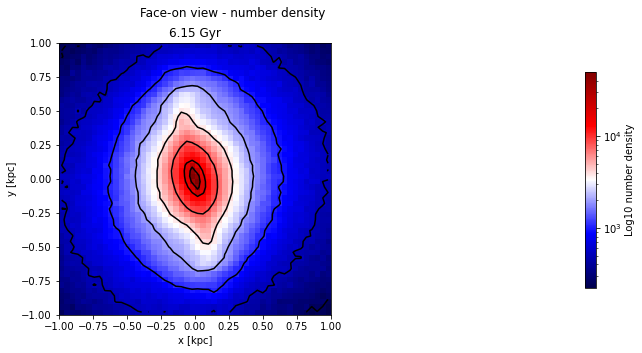

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01270.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 46.977492810664934 degrees*


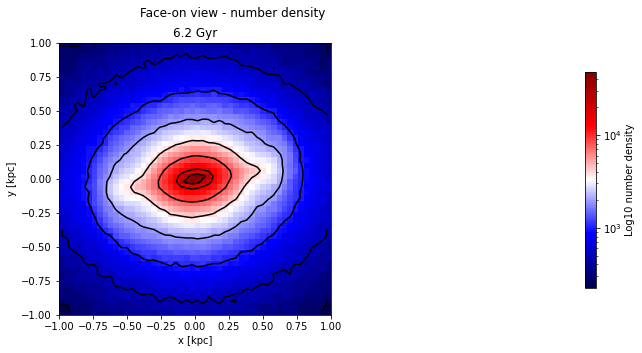

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01280.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 179.4765536288629 degrees*


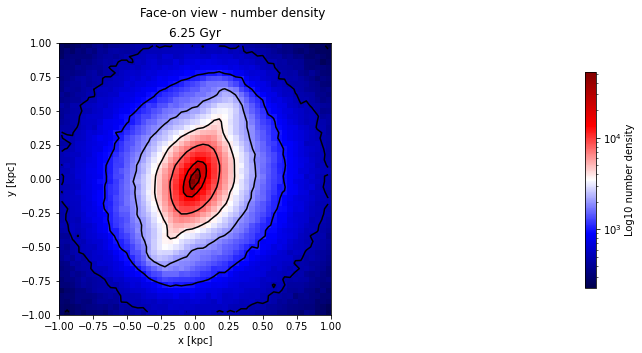

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01290.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 80.98668426330768 degrees*


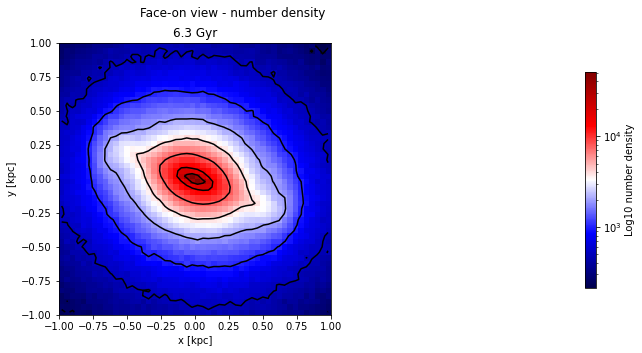

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01300.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by -164.49311371554302 degrees*


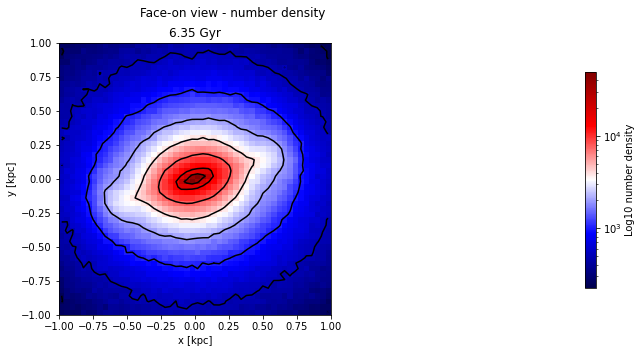

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01310.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 127.40061832790695 degrees*


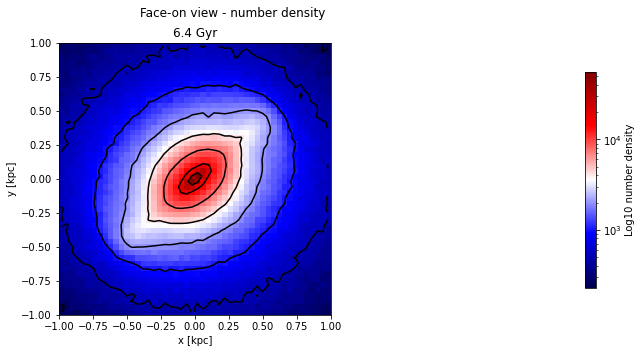

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01320.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 84.71445997281806 degrees*


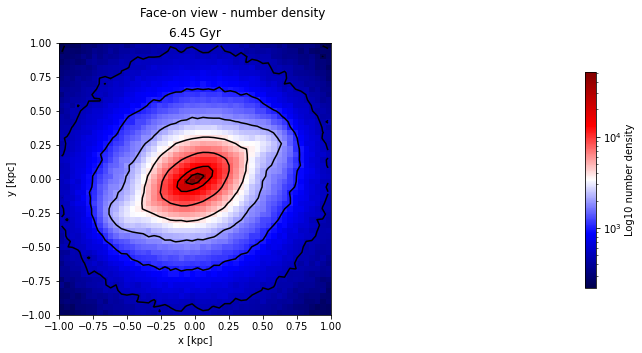

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01330.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by -159.69278062948806 degrees*


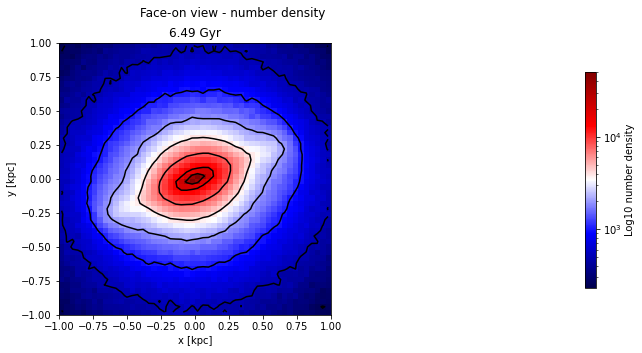

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01340.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 145.48701448074962 degrees*


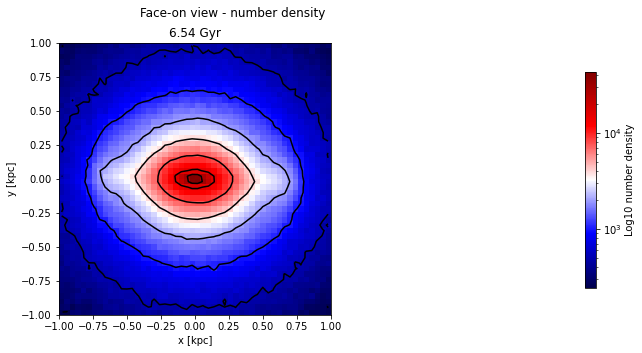

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01350.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by -145.0096509512555 degrees*


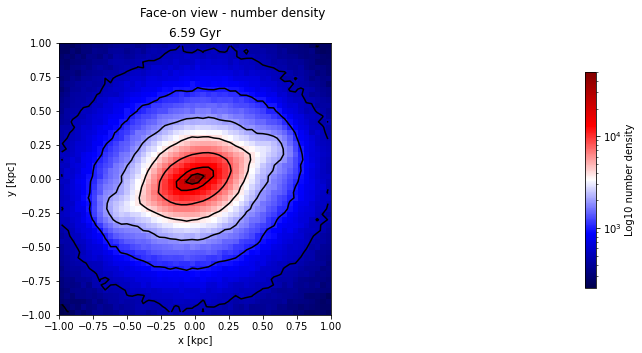

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01360.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by -169.9926244800207 degrees*


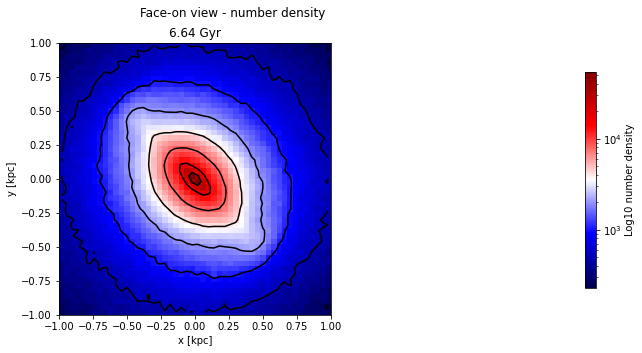

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01370.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by -149.44800369995644 degrees*


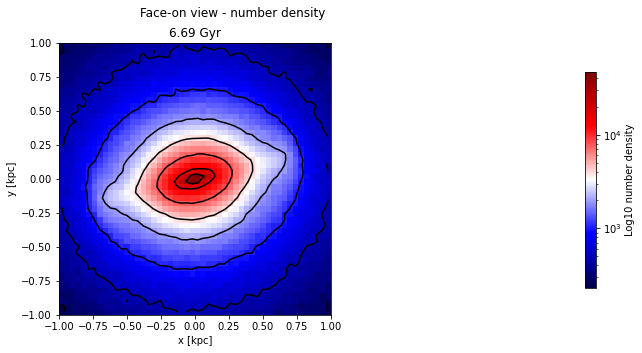

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01380.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by -149.53226537413826 degrees*


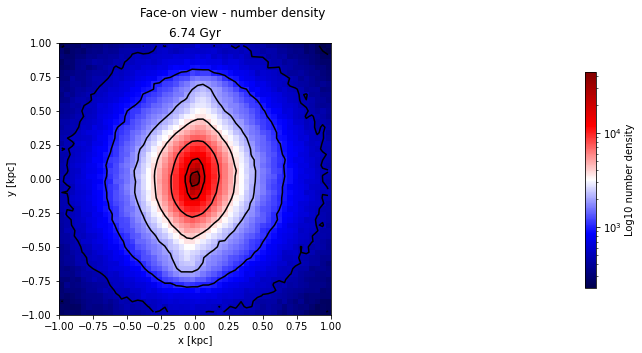

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01390.gz ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 171.5173462072431 degrees*


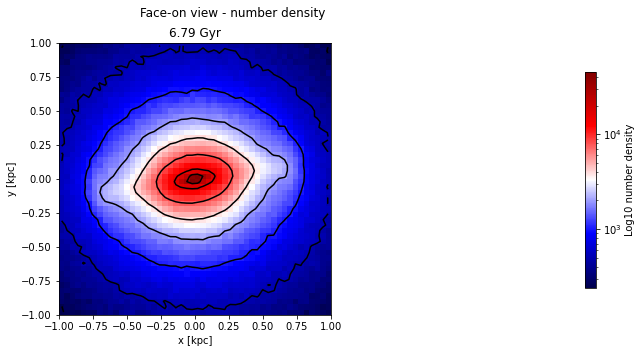

In [3]:
# Zoom in
#xlim, ylim = 0.5, 0.5 #kpc
xlim, ylim = 1, 1 #kpc
#xlim, ylim = 5, 5 #kpc
bins = 50
cmap = 'seismic'
plt_title = 'Face-on view - number density'
cbar_label = 'Log10 number density'

i = 0
for snap in snap_lst:
    
    # make the figure and sub plots
    fig,axes = plt.subplots(1,1,figsize=(14,5))
    
    s = load_data(base_dir + snap)

    age = round(s.properties['time'].in_units('Gyr'),2)
     
    stat2d,xedges,yedges,binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['z'],
                                statistic = 'count',
                                range = [[-xlim,xlim],[-ylim,ylim]],
                                bins = bins)
    
    image = axes.imshow(stat2d.T, 
                    origin = 'lower',
                    extent = [-xlim, xlim, -ylim, ylim ],
                    norm = LogNorm(),
                    cmap=cmap)

    axes.title.set_text(str(age) + ' Gyr')

    xcent = (xedges[1:] + xedges[:-1]) / 2
    ycent = (yedges[1:] + yedges[:-1]) / 2
    axes.contour(xcent, ycent, np.log10(stat2d.T), colors='k')
    i= i + 1
    
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.2, 0.01, 0.6])
    cbar = fig.colorbar(image, cax = cbar_ax)
    cbar.set_label(cbar_label)
    fig.suptitle(plt_title)
    plt.setp(axes, xlabel='x [kpc]')
    plt.setp(axes, ylabel='y [kpc]')
    plt.savefig(snap + 'inner_bar_dev.png')
    plt.show()


### Velocity distribution

#### Load data

In [2]:
# We reload the data to drop effects of prevous manipulations and centre it for face-on view.

s_lst = load_data_lst()

Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01270 ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 46.977492810664934 degrees*
Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01310 ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 127.40061832790695 degrees*
Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01260 ...
Done!
* Bar defined, aligning to 3.0 kpc *
* Realigning bar using |z| < 0.5 *
* Bar realigned by 103.18405996483067 degrees*


#### Mean velocity for inclination 45 deg and different relative PA angles

/tmp/ipykernel_376/579607696.py:45: RuntimeWarning: invalid value encountered in log10
  axes[i].contour(xcent, ycent, np.log10(stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


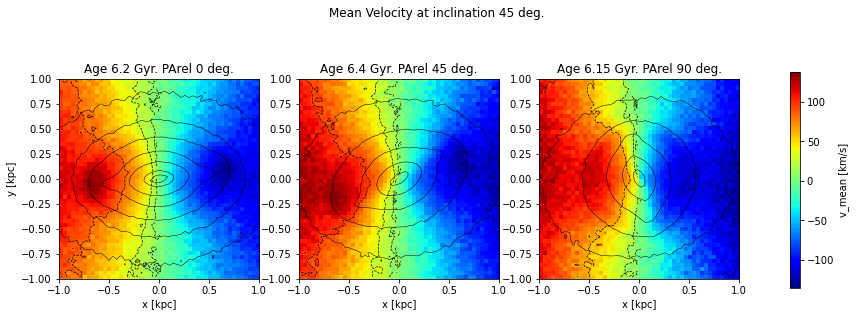

In [18]:
# Zoom in
#xy_lim = [[5,5],[1,1],[0.5,0.5]] #kpc
#xlim, ylim = 0.5, 0.5 #kpc
xlim, ylim = 1, 1 #kpc
#xlim, ylim = 3, 3 #kpc
plt_title = 'Mean velocity'
cbar_label = 'v_mean [km/s]'
bins = 50
cmap = 'jet'

# make the figure and sub plots
fig,axes = plt.subplots(1,3,figsize=(14,5))
incl = 45

i = 0
for s in s_lst:

    age = round(s.properties['time'].in_units('Gyr'),2)

    s.rotate_x(-incl)
        
    d_stat2d,d_xedges,d_yedges,d_binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['z'],
                                  statistic = 'count',
                                  range = [[-xlim,xlim],[-ylim,ylim]],
                                  bins = bins)
        
    stat2d,xedges,yedges,binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['vz'],
                                  statistic = 'mean',
                                  range = [[-xlim,xlim],[-ylim,ylim]],
                                  bins = bins)

    image = axes[i].imshow(stat2d.T, 
                        origin = 'lower',
                        extent = [-xlim, xlim, -ylim, ylim ],
                        cmap = cmap)

    axes[i].title.set_text('Age ' + str(age) + ' Gyr.' + ' PArel ' + str(45*i) + ' deg.')

    xcent = (d_xedges[1:] + d_xedges[:-1]) / 2
    ycent = (d_yedges[1:] + d_yedges[:-1]) / 2
    axes[i].contour(xcent, ycent, np.log10(d_stat2d.T), linewidths = 0.5, colors = 'k')
    
    xcent = (xedges[1:] + xedges[:-1]) / 2
    ycent = (yedges[1:] + yedges[:-1]) / 2
    axes[i].contour(xcent, ycent, np.log10(stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')
    
    i = i + 1
    
    s.rotate_x(incl) # Rotate back to original position
    
fig.subplots_adjust(right = 0.8)
cbar_ax = fig.add_axes([0.85, 0.2, 0.01, 0.6])
cbar = fig.colorbar(image, cax = cbar_ax)
cbar.set_label(cbar_label)
fig.suptitle(plt_title + ' at inclination ' + str(incl) + ' deg.')
plt.setp(axes[:], xlabel = 'x [kpc]')
plt.setp(axes[0], ylabel = 'y [kpc]')
plt.savefig('run732HF_losv_mean.png')
plt.show()


#### Velocity dispersion for different relative PA and inclinations

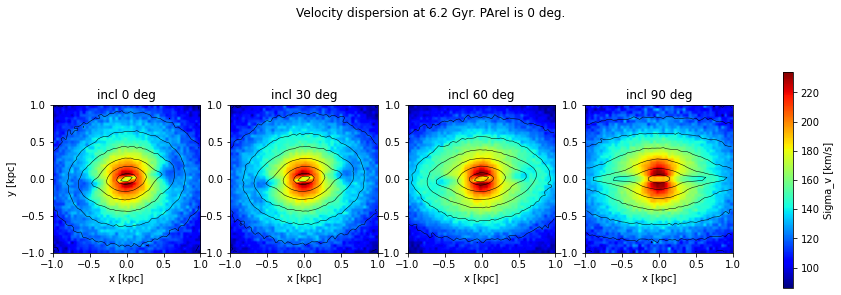

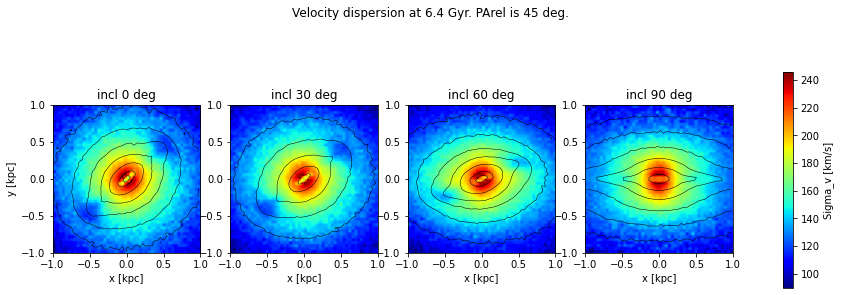

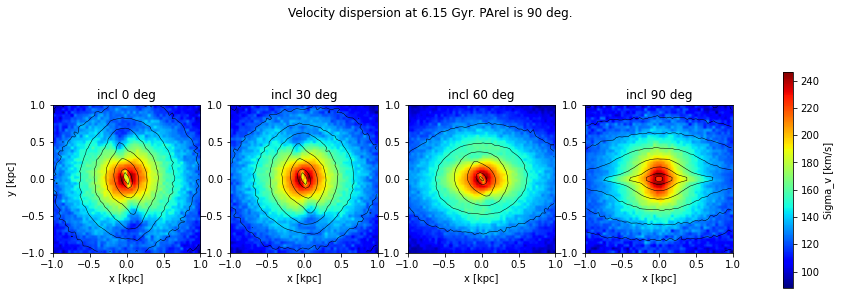

In [14]:
# Zoom in
#xy_lim = [[5,5],[1,1],[0.5,0.5]] #kpc
#xlim, ylim = 0.5, 0.5 #kpc
xlim, ylim = 1, 1 #kpc
#xlim, ylim = 3, 3 #kpc
plt_title = 'Velocity dispersion'
cbar_label = 'Sigma_v [km/s]'
bins = 50
cmap = 'jet'

j = 0
for s in s_lst:
    
    incl_lst = [0,30,60,90]
    # make the figure and sub plots
    age = round(s.properties['time'].in_units('Gyr'),2)
    fig,axes = plt.subplots(1,4,figsize=(14,5))
    
    i = 0
    for incl in incl_lst:
        if i > 0:
            s.rotate_x(-30*i/i)
        
        d_stat2d,d_xedges,d_yedges,d_binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['z'],
                                  statistic = 'count',
                                  range = [[-xlim,xlim],[-ylim,ylim]],
                                  bins = bins)
        
        stat2d,xedges,yedges,binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['vz'],
                                  statistic = 'std',
                                  range = [[-xlim,xlim],[-ylim,ylim]],
                                  bins = bins)

        image = axes[i].imshow(stat2d.T, 
                        origin = 'lower',
                        extent = [-xlim, xlim, -ylim, ylim ],
                        cmap = cmap)

        axes[i].title.set_text('incl ' + str(incl) + ' deg')

        xcent = (d_xedges[1:] + d_xedges[:-1]) / 2
        ycent = (d_yedges[1:] + d_yedges[:-1]) / 2
        axes[i].contour(xcent, ycent, np.log10(d_stat2d.T), linewidths = 0.5, colors = 'k')
        i = i + 1
    
    fig.subplots_adjust(right = 0.8)
    cbar_ax = fig.add_axes([0.85, 0.2, 0.01, 0.6])
    cbar = fig.colorbar(image, cax = cbar_ax)
    cbar.set_label(cbar_label)
    fig.suptitle(plt_title + ' at ' + str(age) + ' Gyr.' + ' PArel ' + str(45*j) + ' deg.')
    plt.setp(axes[:], xlabel ='x [kpc]')
    plt.setp(axes[0], ylabel ='y [kpc]')
    plt.savefig(data_fname_lst[j] + '_losvd.png')
    plt.show()
    j = j + 1
    
    s.rotate_x(90) # Rotate back to original position

#### Edge-on - h3 and h4 for different relative PA angles

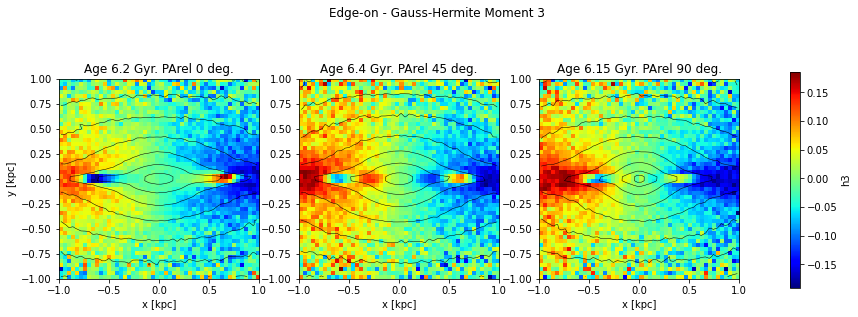

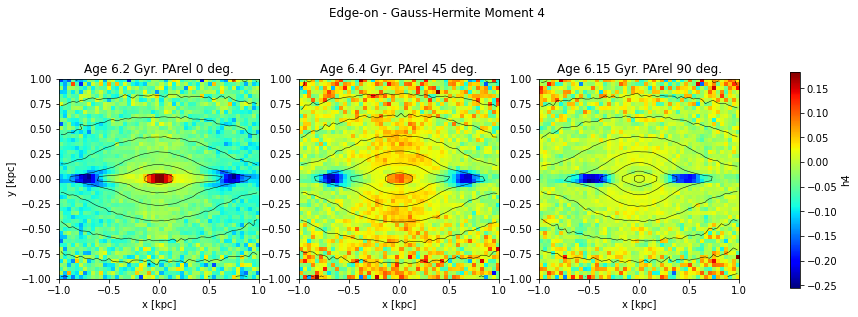

In [17]:
# Zoom in
#xy_lim = [[5,5],[1,1],[0.5,0.5]] #kpc
#xlim, ylim = 0.5, 0.5 #kpc
xlim, ylim = 1, 1 #kpc
#xlim, ylim = 7, 7 #kpc
plt_title = 'Edge-on - Gauss-Hermite Moment '
cbar_label = 'h'
incl = 90
m_lst = [3,4]
bins = 50
#cmap = 'seismic'
cmap = 'jet'

for m in m_lst:
    # make the figure and sub plots
    fig,axes = plt.subplots(1,3,figsize=(14,5))
    
    i = 0
    for s in s_lst:

        age = round(s.properties['time'].in_units('Gyr'),2)

        s.rotate_x(-incl)
        
        d_stat2d,d_xedges,d_yedges,d_binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['z'],
                                      statistic = 'count',
                                      range = [[-xlim,xlim],[-ylim,ylim]],
                                      bins = bins)
        
        stat2d,xedges,yedges,binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['vz'],
                                      statistic = lambda bin_values: GaussHermiteMoment(bin_values, m),
                                      range = [[-xlim,xlim],[-ylim,ylim]],
                                      bins = bins)

        image = axes[i].imshow(stat2d.T, 
                            origin = 'lower',
                            extent = [-xlim, xlim, -ylim, ylim ],
                            cmap = cmap)

        axes[i].title.set_text('Age ' + str(age) + ' Gyr.' + ' PArel ' + str(45*i) + ' deg.')

        xcent = (d_xedges[1:] + d_xedges[:-1]) / 2
        ycent = (d_yedges[1:] + d_yedges[:-1]) / 2
        axes[i].contour(xcent, ycent, np.log10(d_stat2d.T), linewidths = 0.5, colors = 'k')
    
        i = i + 1
    
        s.rotate_x(incl) # Rotate back to original position
    
    fig.subplots_adjust(right = 0.8)
    cbar_ax = fig.add_axes([0.85, 0.2, 0.01, 0.6])
    cbar = fig.colorbar(image, cax = cbar_ax)
    cbar.set_label(cbar_label + str(m))
    fig.suptitle(plt_title + str(m))
    plt.setp(axes[:], xlabel = 'x [kpc]')
    plt.setp(axes[0], ylabel = 'y [kpc]')
    plt.savefig('run732HF_h' + str(m) + '.png')
    plt.show()
    

#### Edge-on velocity distribution map series

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01200.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 76.86466203656133 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


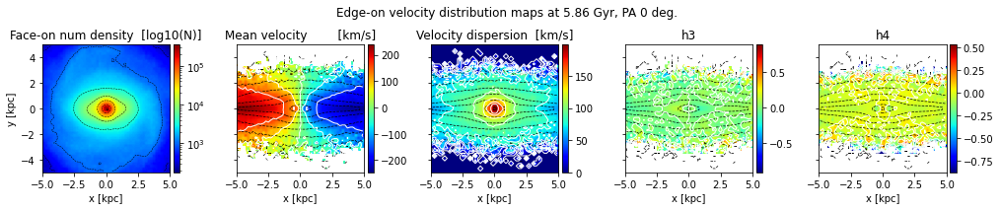

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01210.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 174.599310842863 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


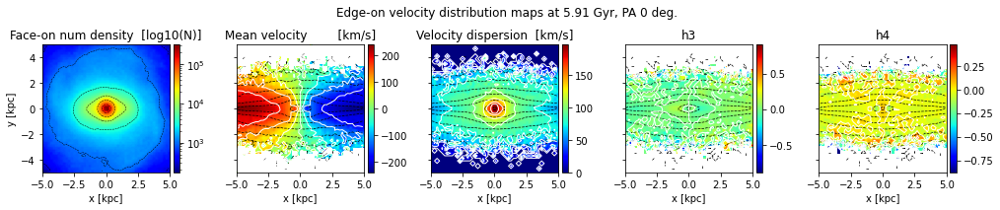

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01220.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 88.64641316008235 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


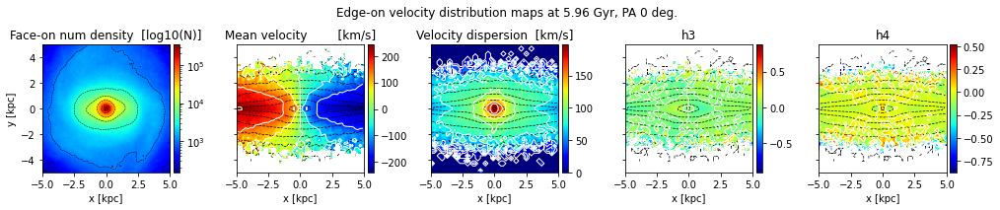

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01230.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -172.62155486404146 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


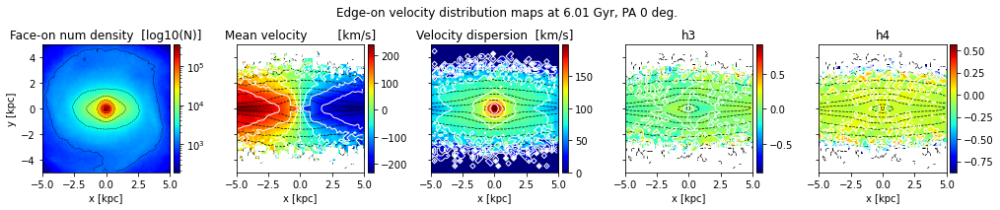

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01240.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 103.69997384566695 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


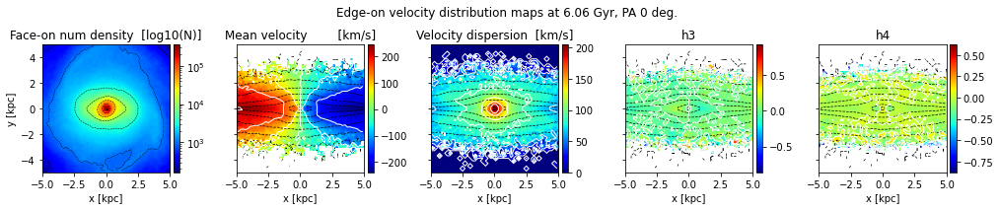

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01250.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -167.08701143655207 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


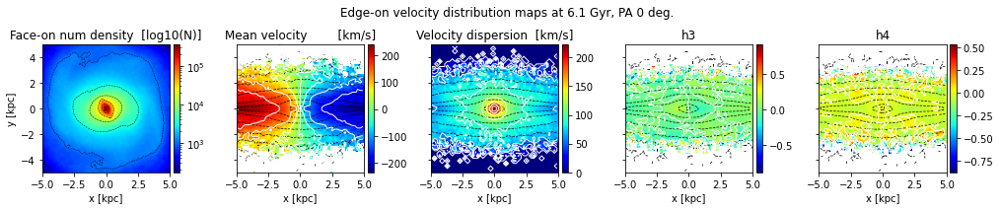

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01260.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 103.18405996483042 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


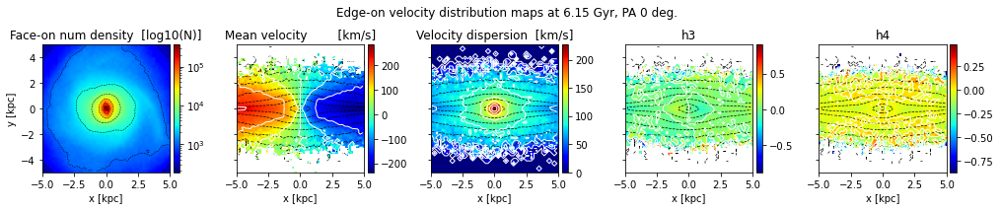

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01270.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 46.977492810664934 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


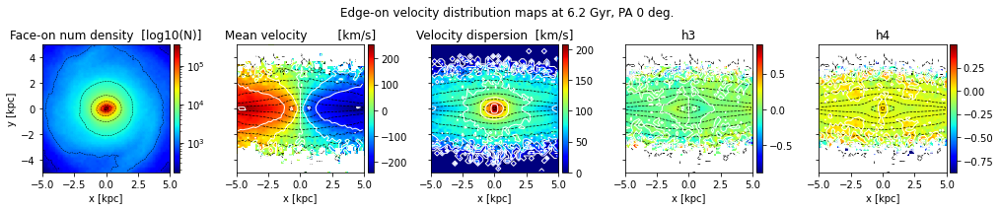

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01280.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 179.4765536288629 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


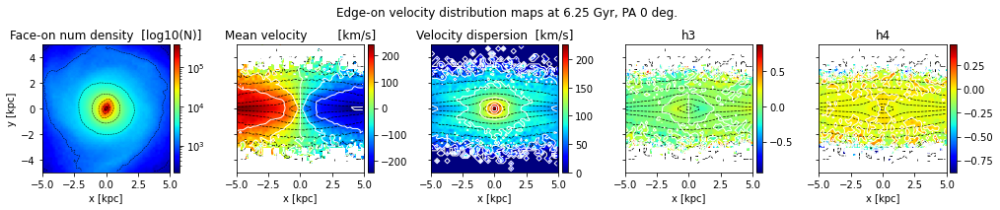

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01290.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 80.98668426330768 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


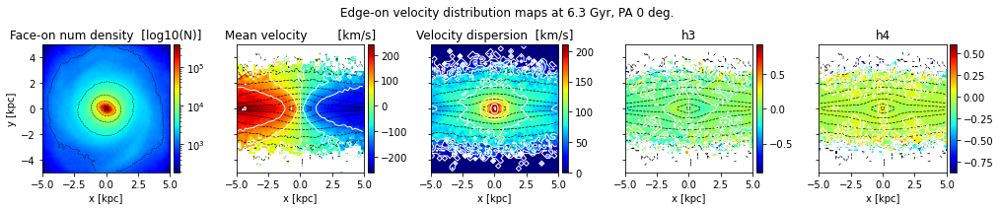

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01300.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -164.49311371554302 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


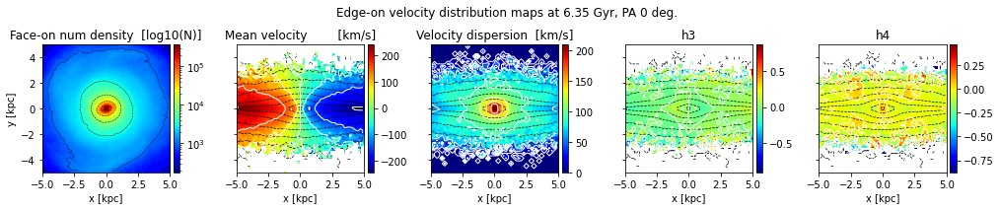

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01310.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 127.40061832790695 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


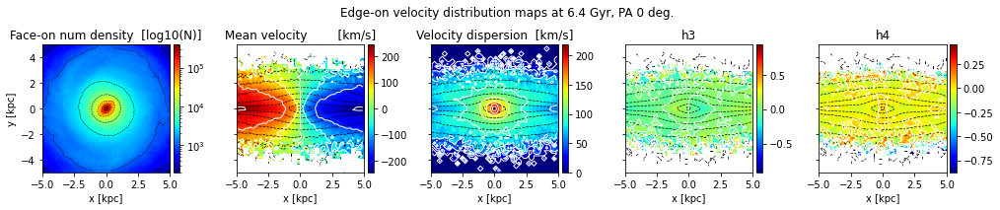

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01320.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 84.71445997281806 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


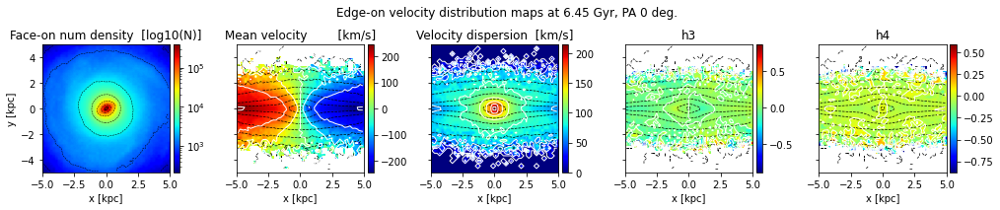

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01330.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -159.69278062948806 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


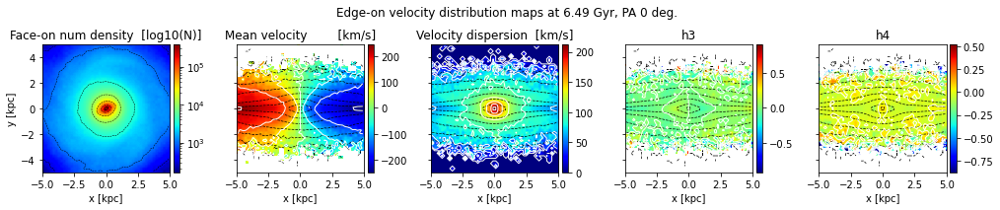

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01340.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 145.48701448074962 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


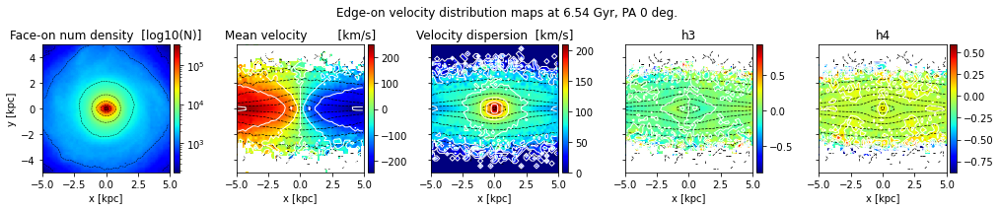

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01350.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -145.0096509512555 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


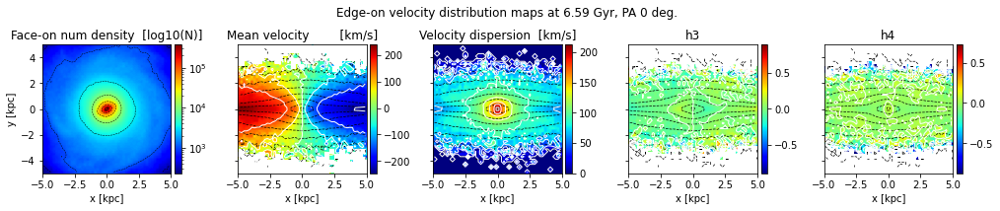

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01360.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -169.9926244800207 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


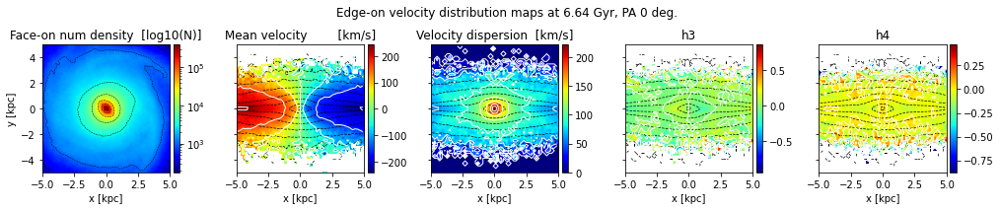

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01370.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -149.44800369995644 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


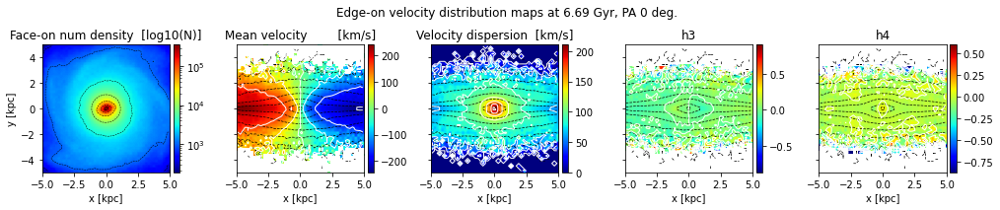

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01380.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -149.53226537413826 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


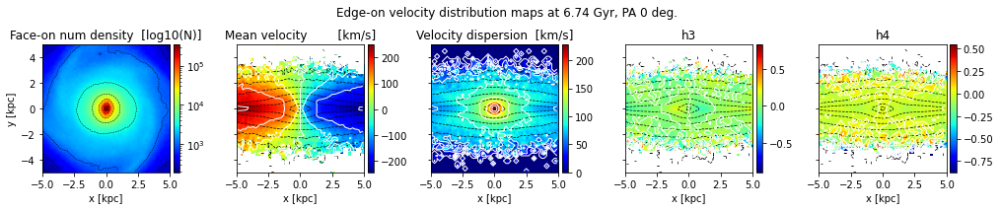

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01390.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 171.5173462072431 degrees


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


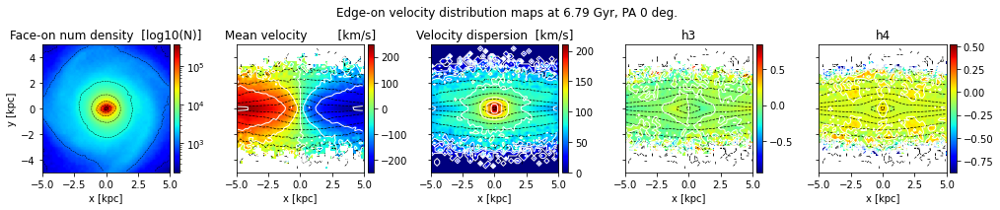

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01200.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 76.86466203656133 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


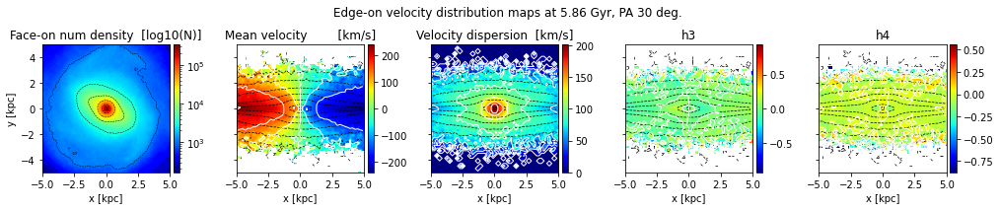

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01210.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 174.599310842863 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


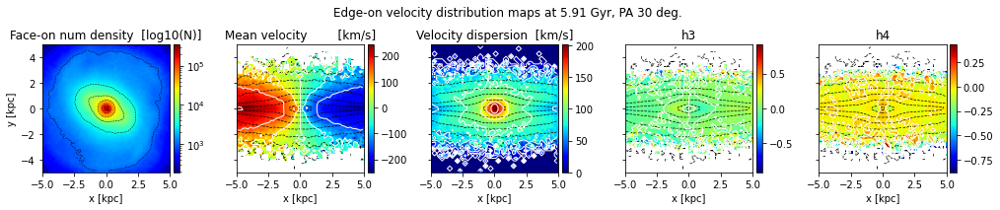

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01220.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 88.64641316008235 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


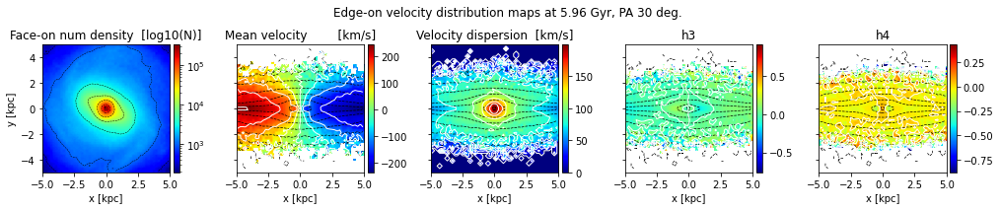

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01230.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -172.62155486404146 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


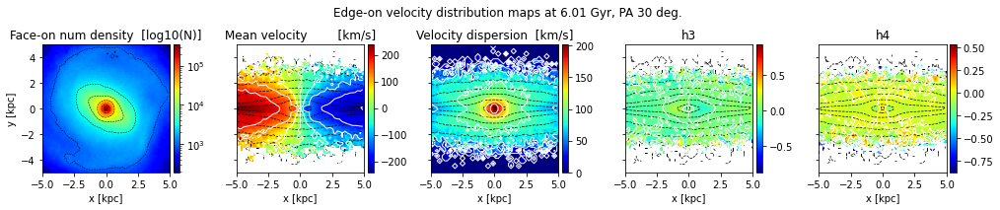

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01240.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 103.69997384566695 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


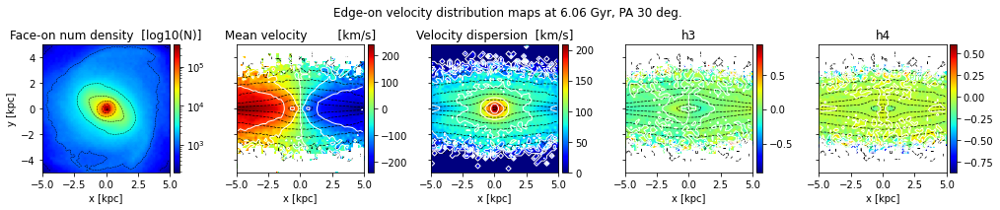

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01250.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -167.08701143655207 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


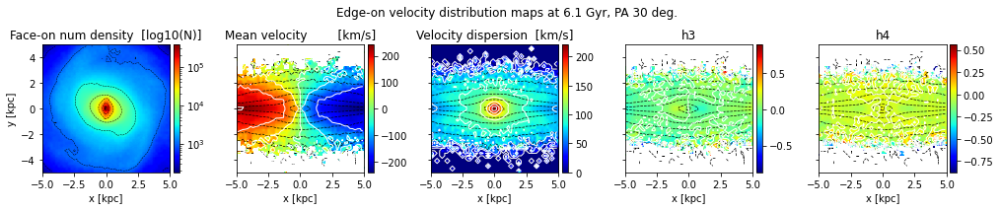

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01260.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 103.18405996483042 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


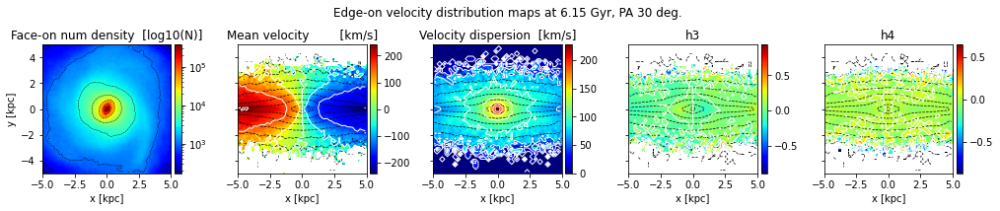

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01270.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 46.977492810664934 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


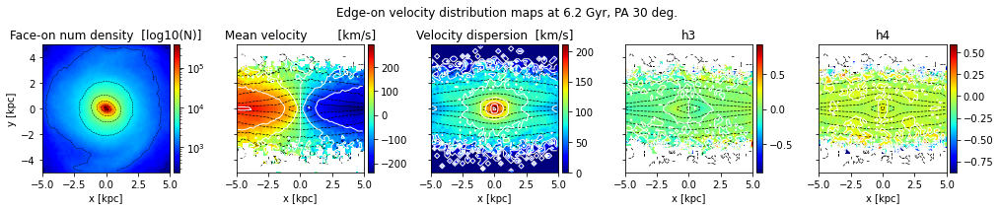

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01280.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 179.4765536288629 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


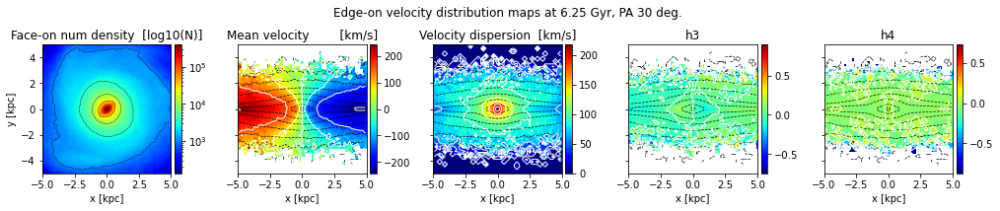

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01290.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 80.98668426330768 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


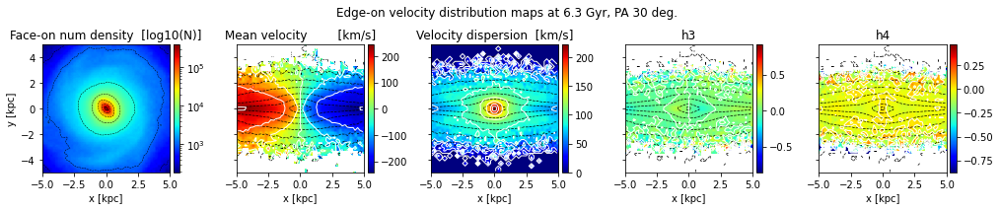

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01300.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -164.49311371554302 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


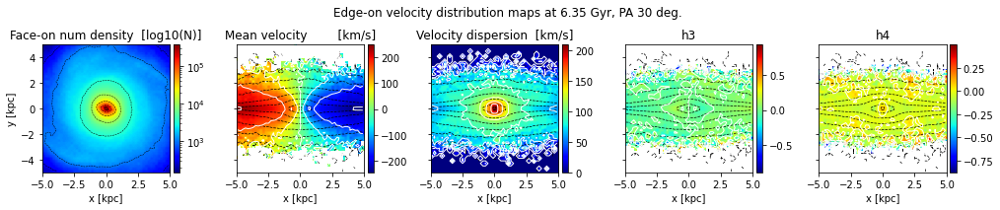

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01310.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 127.40061832790695 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


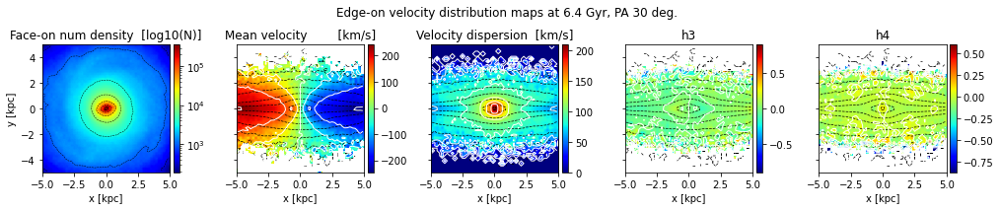

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01320.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 84.71445997281806 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


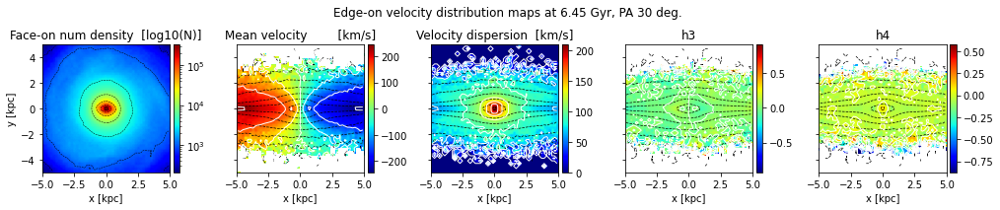

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01330.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -159.6927806294851 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


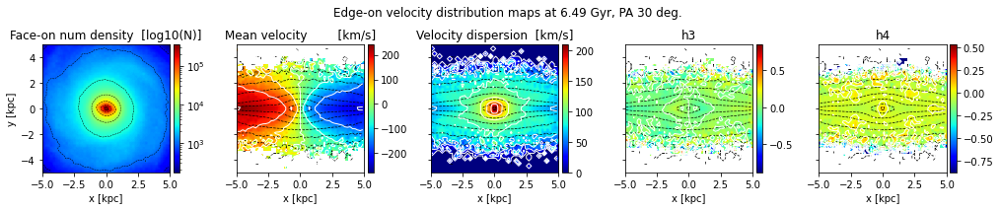

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01340.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 145.48701448074962 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


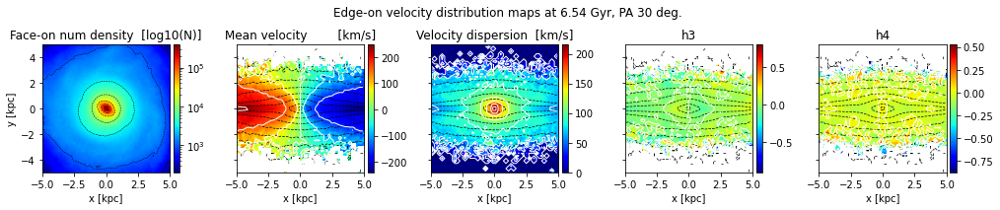

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01350.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -145.0096509512555 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


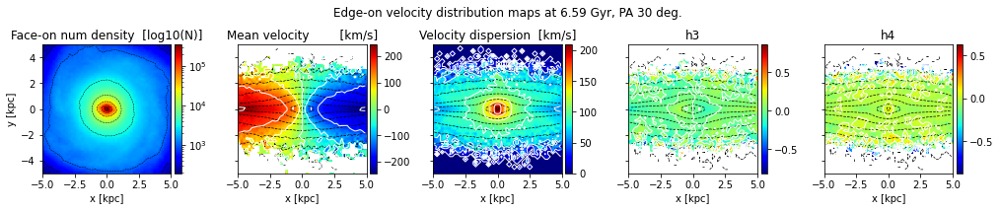

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01360.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -169.9926244800207 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


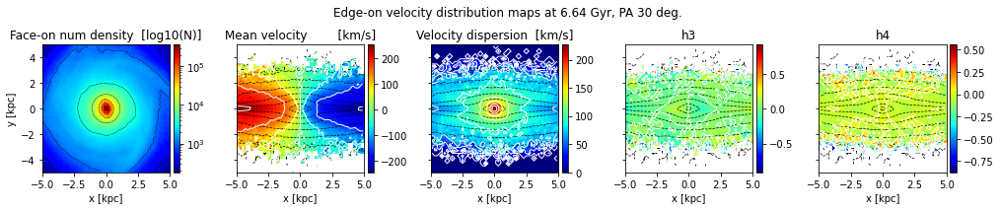

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01370.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -149.44800369995644 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


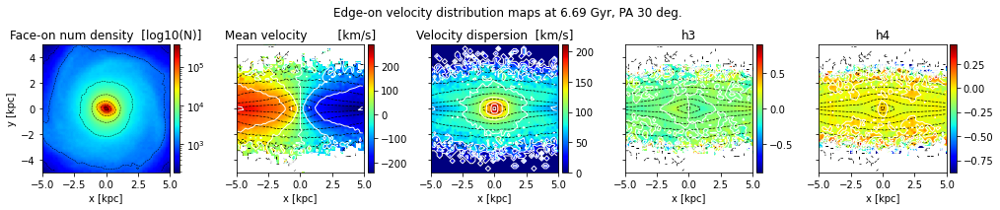

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01380.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -149.53226537413994 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


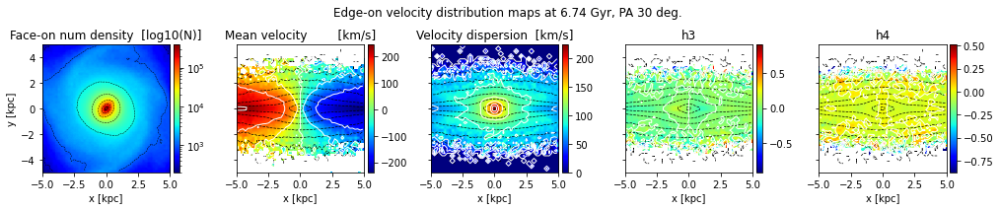

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01390.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 171.5173462072431 degrees
* Rotating the primary bar to PA 30 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


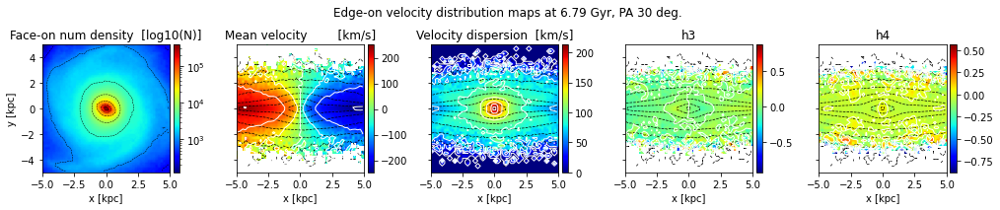

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01200.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 76.86466203656133 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


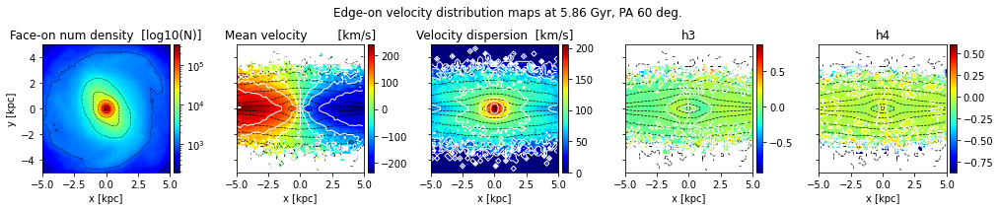

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01210.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 174.59931084286313 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


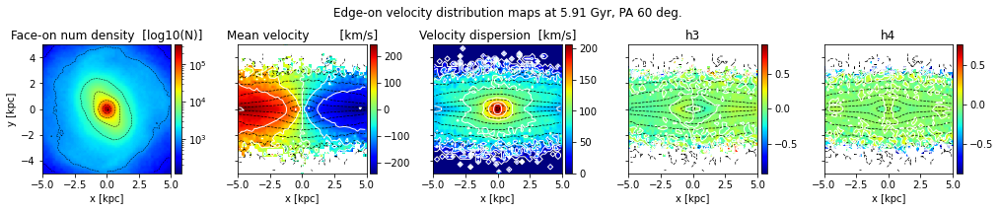

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01220.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 88.64641316008235 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


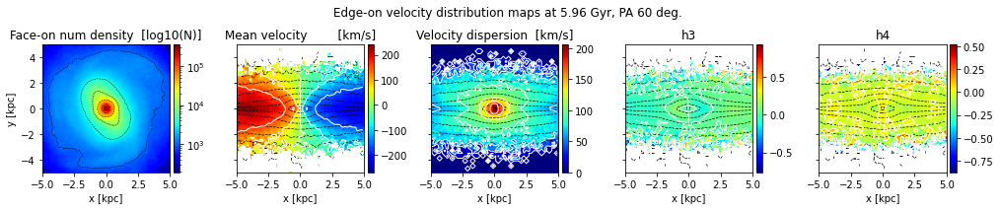

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01230.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -172.62155486404146 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


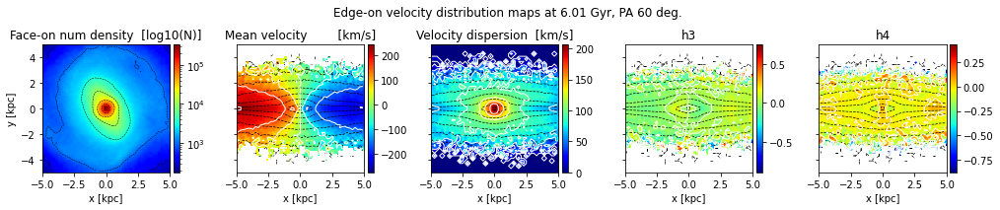

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01240.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 103.69997384566695 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


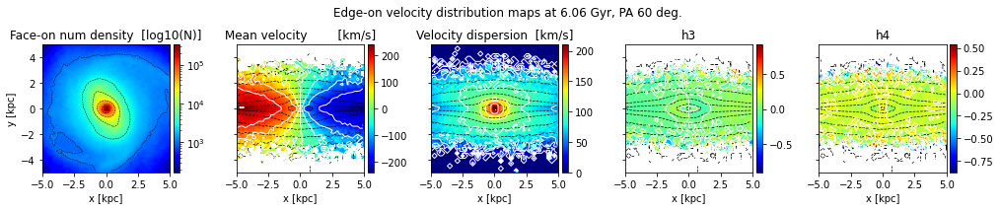

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01250.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -167.08701143655207 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


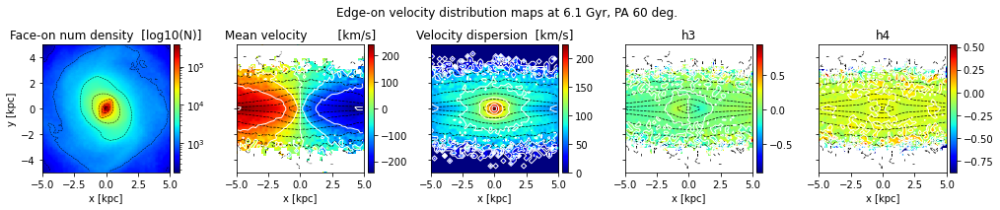

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01260.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 103.18405996483067 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


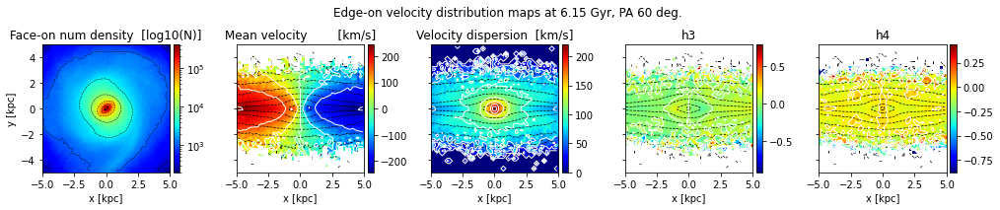

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01270.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 46.977492810664934 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


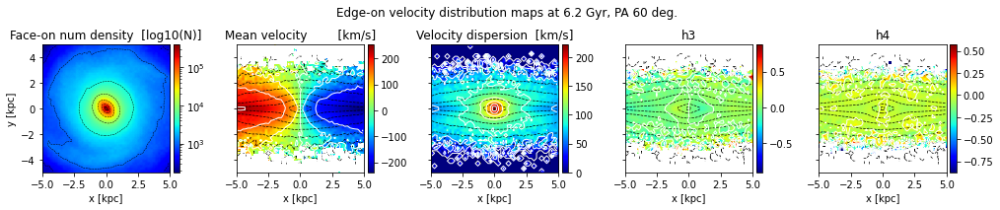

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01280.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 179.4765536288629 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


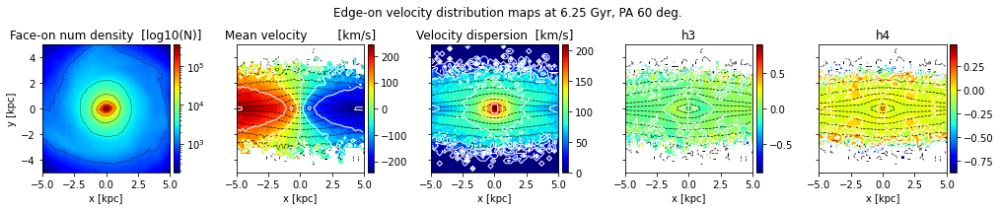

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01290.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 80.98668426330768 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


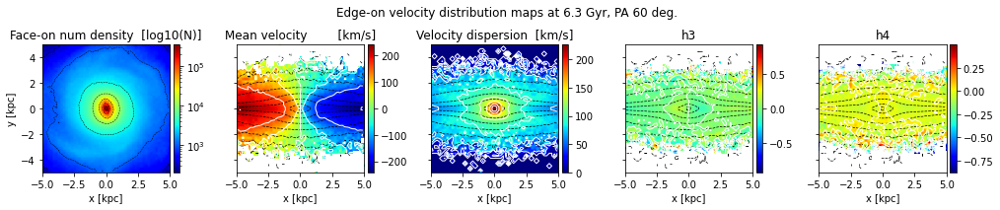

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01300.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -164.49311371554302 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


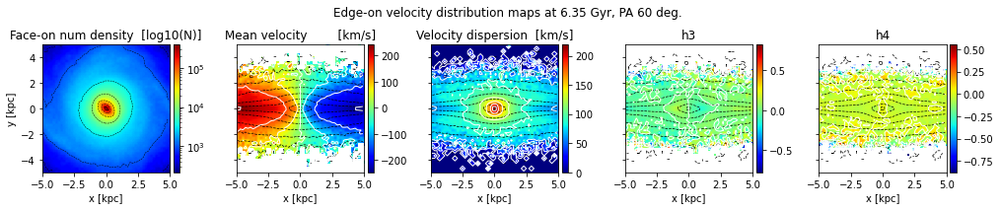

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01310.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 127.40061832790695 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


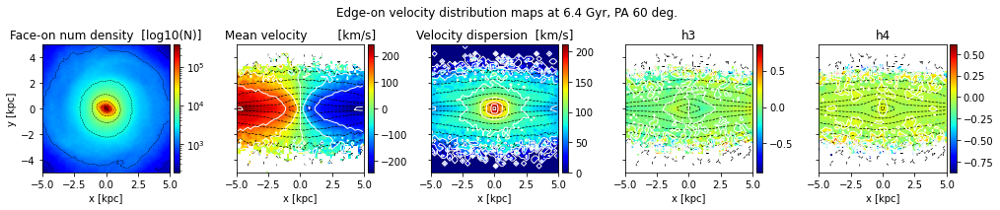

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01320.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 84.71445997281806 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


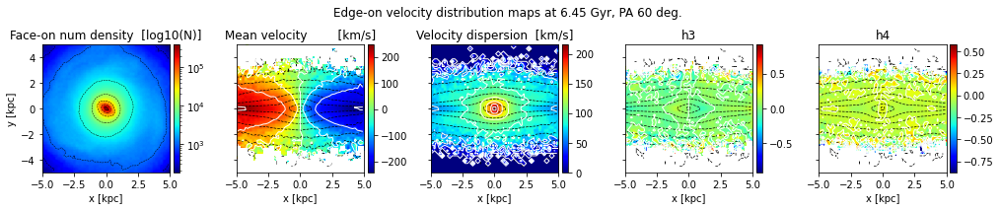

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01330.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -159.6927806294851 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


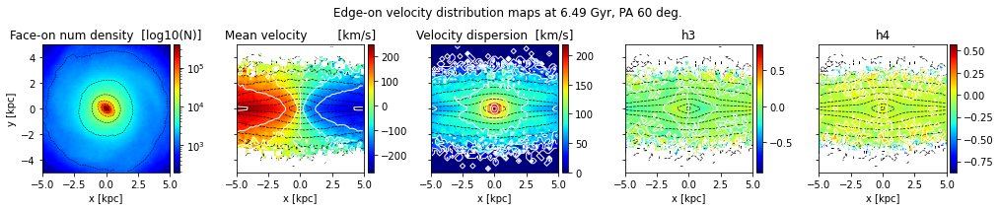

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01340.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 145.48701448075272 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


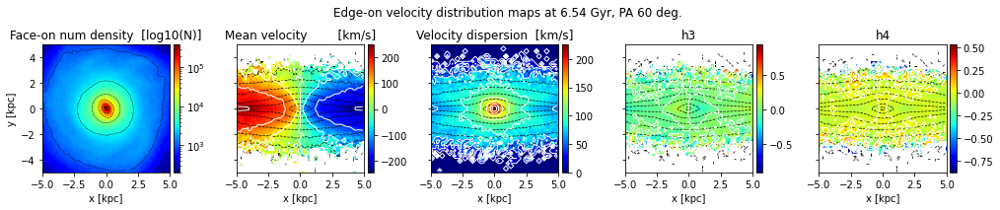

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01350.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -145.0096509512555 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


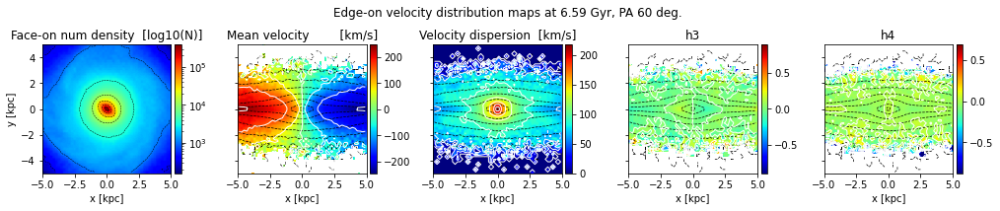

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01360.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -169.9926244800207 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


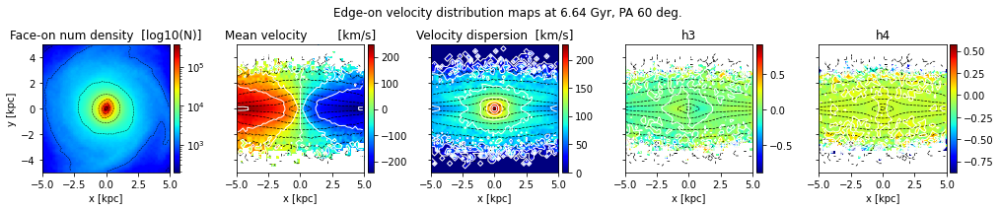

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01370.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -149.44800369995644 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


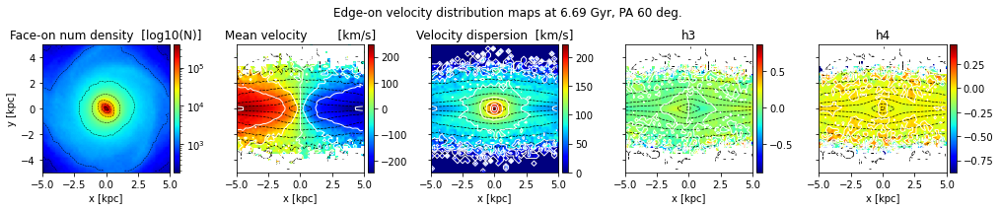

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01380.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -149.53226537413826 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


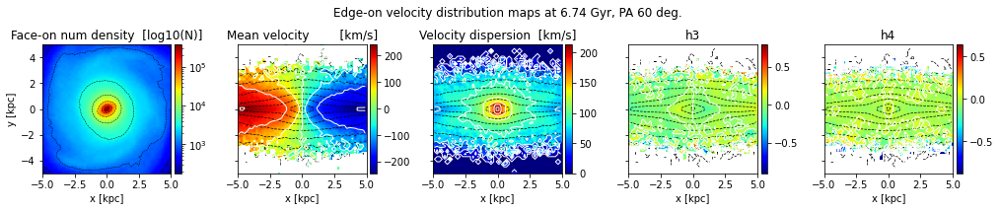

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01390.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 171.5173462072431 degrees
* Rotating the primary bar to PA 60 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


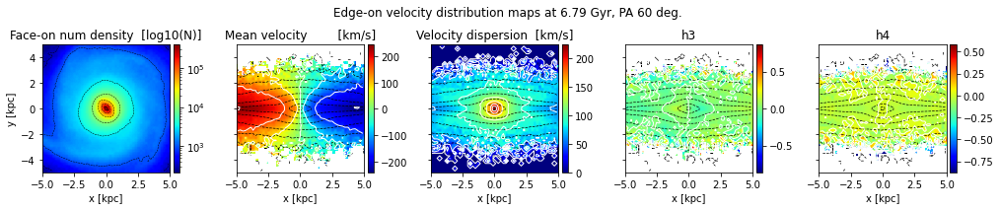

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01200.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 76.86466203656133 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


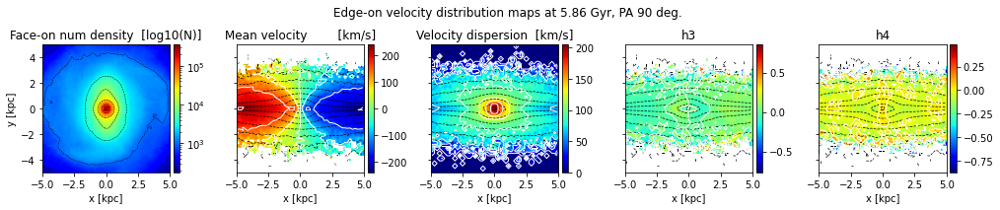

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01210.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 174.59931084286313 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


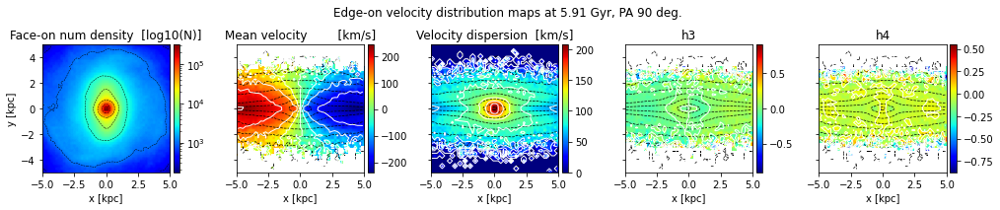

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01220.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 88.64641316008235 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


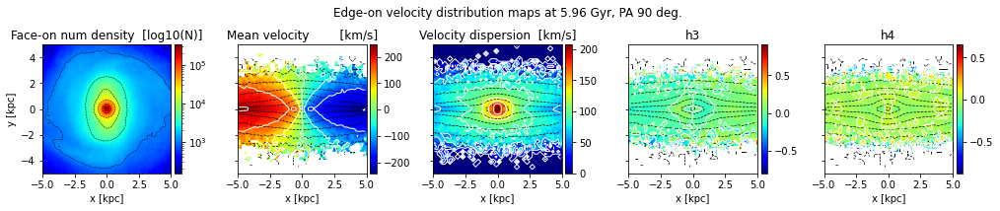

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01230.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -172.62155486404146 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


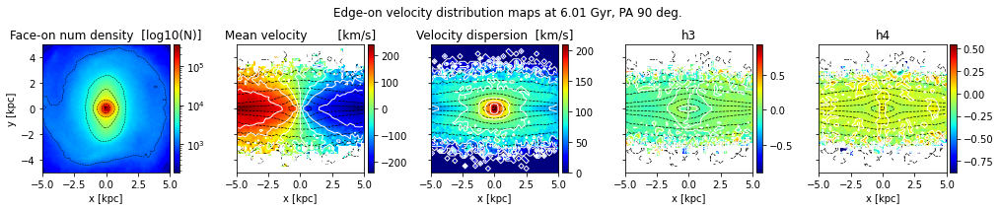

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01240.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 103.69997384566695 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


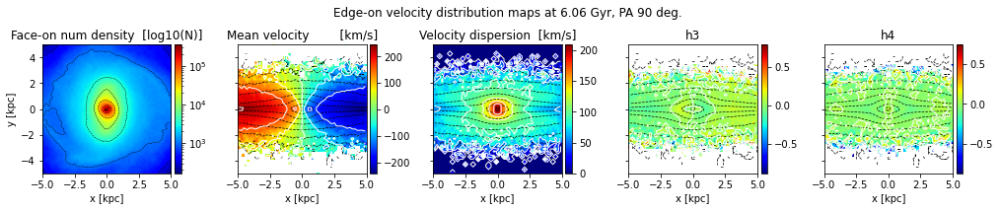

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01250.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -167.08701143655207 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


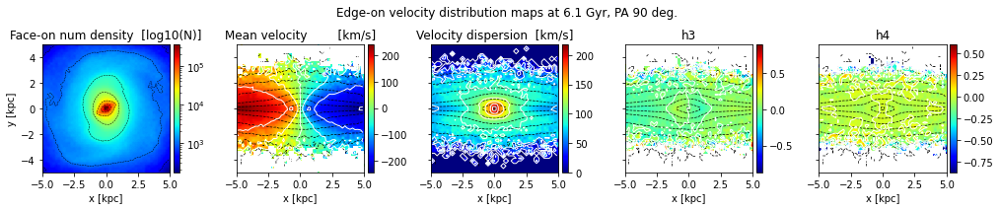

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01260.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 103.18405996483067 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


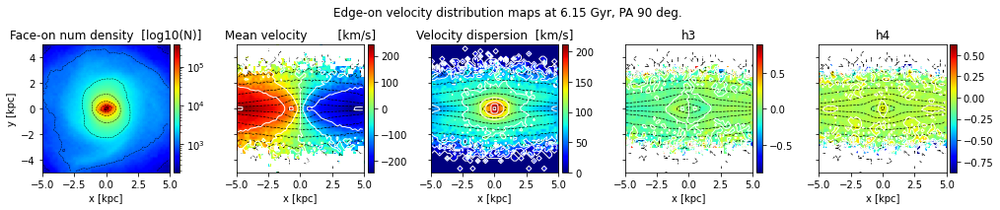

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01270.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 46.977492810664934 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


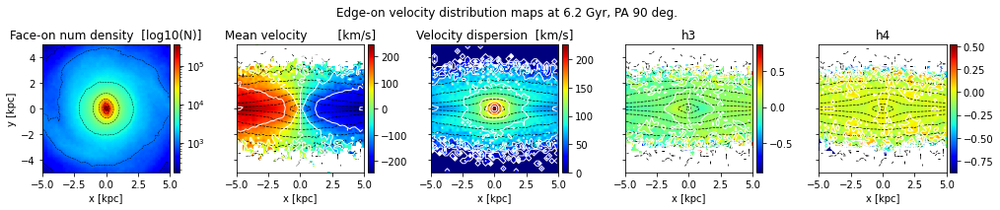

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01280.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 179.4765536288629 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


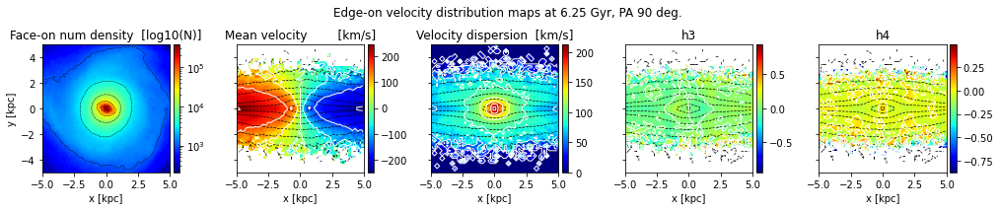

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01290.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 80.98668426330768 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


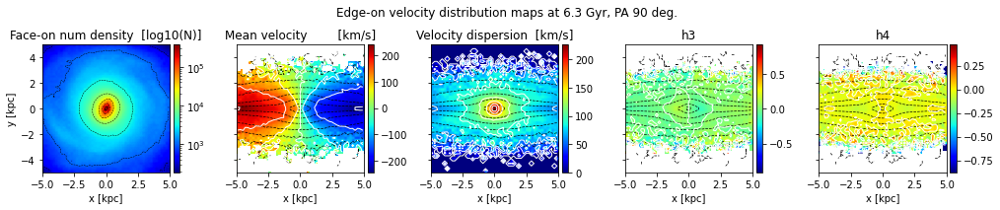

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01300.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -164.49311371554302 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


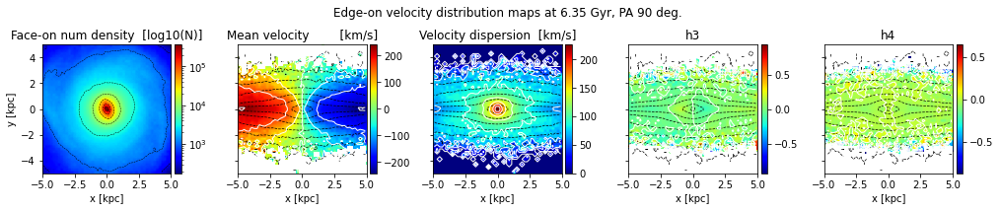

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01310.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 127.40061832790695 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


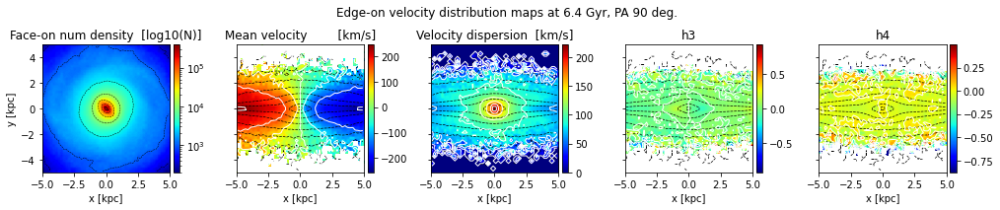

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01320.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 84.71445997281806 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


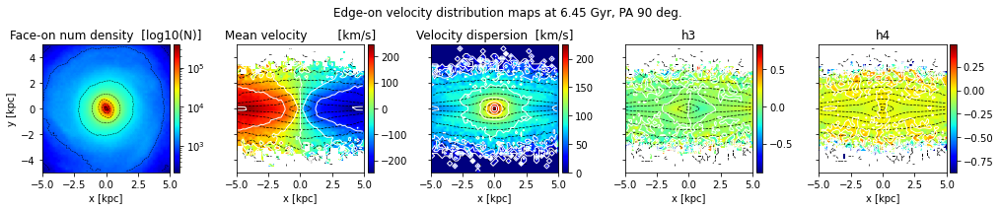

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01330.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -159.69278062948806 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


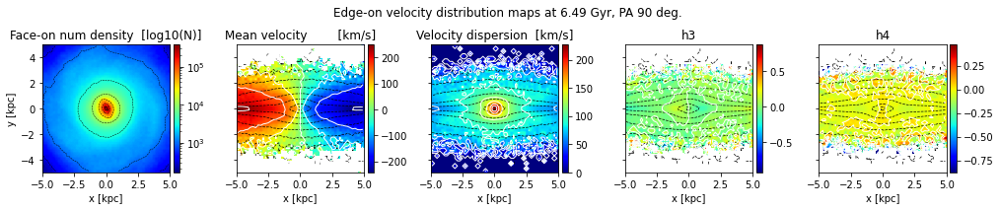

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01340.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 145.48701448074962 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


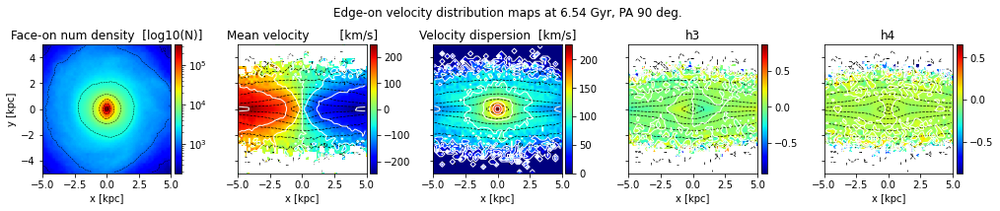

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01350.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -145.0096509512555 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


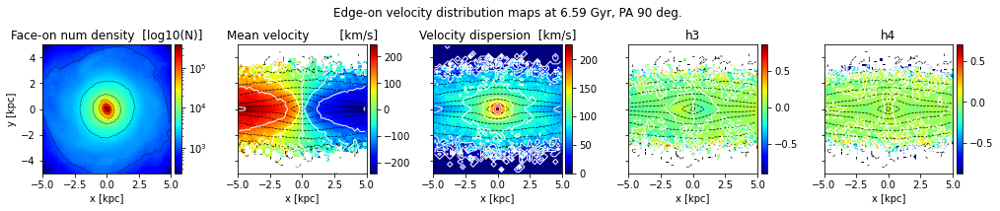

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01360.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -169.9926244800207 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


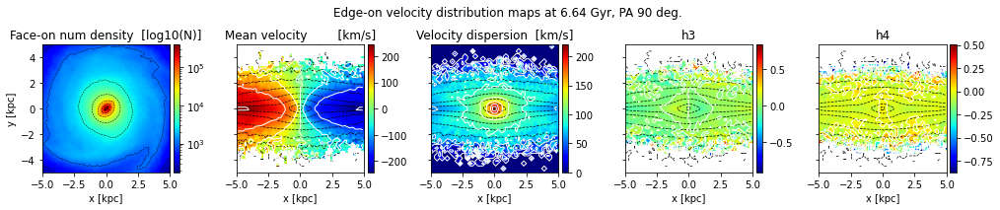

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01370.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -149.44800369995644 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


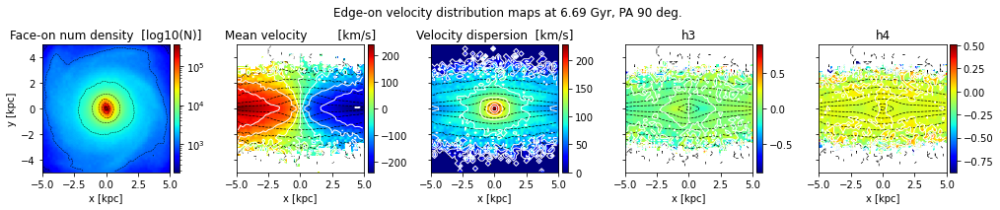

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01380.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by -149.53226537413826 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


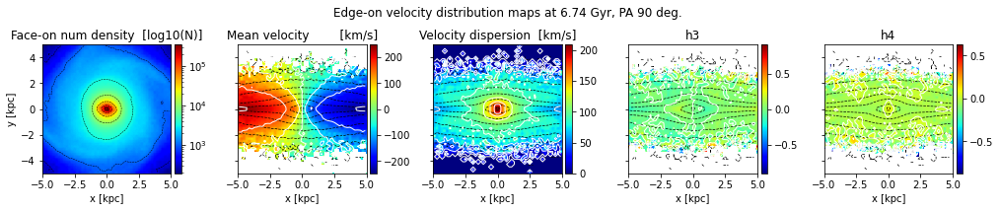

* Loading data from file /home/ubuntu/projects/S2B/models/run732HF/run732HF.01390.gz ...
* Centering the data...
* Bar defined, aligning to 3.0 kpc
* Realigning bar using |z| < 0.5 
* Bar realigned by 171.5173462072431 degrees
* Rotating the primary bar to PA 90 deg


/tmp/ipykernel_1059/3379040018.py:101: RuntimeWarning: divide by zero encountered in log10
  axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')


* Done!


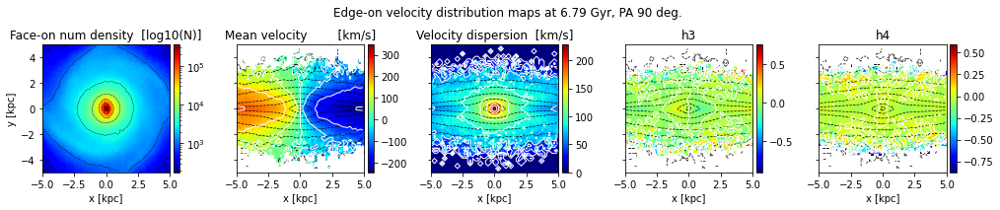

In [2]:
# Zoom in
#xlim, ylim = 5, 5 #kpc
#xlim, ylim = 2, 2 #kpc
xlim, ylim = 1, 1 #kpc
bins = 50
cmap = 'seismic'
plt_title = 'Edge-on velocity distribution maps'
splt_title_lst = ['Face-on num density  [log10(N)]',
                  'Mean velocity        [km/s]',
                  'Velocity dispersion  [km/s]',
                  'h3',
                  'h4']
cbar_label_lst = ['Log10(N)',
                  'v_mean [km/s]',
                  'sigma_v [km/s]',
                  'h3',
                  'h4']
incl = 90
pa_lst = [0,30,60,90]

for pa in pa_lst:
    for snap in snap_lst:
        #start_time = datetime.now() 
    
        stat2d_lst = []
        
        # make the figure and sub plots
        fig,axes = plt.subplots(1,5,figsize=(14,3))
    
        # Load snapshot data, center face-on, align primary bar using inertia tensor
        s = pbload(base_dir + snap,param_fname,log=True)
    
        # Snapshot age
        age = round(s.properties['time'].in_units('Gyr'),2)
    
        if pa > 0:
            s.rotate_z(-pa)
            print('* Rotating the primary bar to PA ' + str(pa) + ' deg')
        
        # Number density statistics face-on for inner bar reference plot
        df_stat2d,df_xedges,df_yedges,df_binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['z'],
                                  statistic = 'count',
                                  range = [[-xlim,xlim],[-ylim,ylim]],
                                  bins = bins)
        stat2d_lst.append(df_stat2d.T)
        
        # Rotate to edge-on view
        s.rotate_x(-incl) 
    
        # Number density statistics for velocity maps density contours
        de_stat2d,de_xedges,de_yedges,de_binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['z'],
                                  statistic = 'count',
                                  range = [[-xlim,xlim],[-ylim,ylim]],
                                  bins = bins)
    
        # Mean velicity statistics
        v_stat2d,v_xedges,v_yedges,v_binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['vz'],
                                  statistic = 'mean',
                                  range = [[-xlim,xlim],[-ylim,ylim]],
                                  bins = bins)
        stat2d_lst.append(v_stat2d.T)
    
        # Velocity dispersion statistics
        vd_stat2d,vd_xedges,vd_yedges,vd_binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['vz'],
                                  statistic = 'std',
                                  range = [[-xlim,xlim],[-ylim,ylim]],
                                  bins = bins)
        stat2d_lst.append(vd_stat2d.T)
    
        # Gauss-Hermite h3 moment
        h3_stat2d,h3_xedges,h3_yedges,h3_binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['vz'],
                                      statistic = lambda bin_values: GaussHermiteMoment(bin_values, 3),
                                      range = [[-xlim,xlim],[-ylim,ylim]],
                                      bins = bins)
        stat2d_lst.append(h3_stat2d.T)
    
        # Gauss-Hermite h4 moment
        h4_stat2d,h4_xedges,h4_yedges,h4_binnum2d = st.binned_statistic_2d(s.star['x'], s.star['y'], s.star['vz'],
                                      statistic = lambda bin_values: GaussHermiteMoment(bin_values, 4),
                                      range = [[-xlim,xlim],[-ylim,ylim]],
                                      bins = bins)
        stat2d_lst.append(h4_stat2d.T)
    
        for i in range(5):
            if i == 0:
                image = axes[i].imshow(stat2d_lst[i], 
                        origin = 'lower',
                        extent = [-xlim, xlim, -ylim, ylim ],
                        norm = LogNorm(),
                        cmap = cmap)
                xcent = (df_xedges[1:] + df_xedges[:-1]) / 2
                ycent = (df_yedges[1:] + df_yedges[:-1]) / 2
                axes[i].contour(xcent, ycent, np.log10(df_stat2d.T), linewidths = 0.5, linestyles = 'dashed', colors = 'k')
            else:
                image = axes[i].imshow(stat2d_lst[i], 
                        origin = 'lower',
                        extent = [-xlim, xlim, -ylim, ylim ],
                        cmap = cmap)
                xcent = (de_xedges[1:] + de_xedges[:-1]) / 2
                ycent = (de_yedges[1:] + de_yedges[:-1]) / 2
                axes[i].contour(xcent, ycent, np.log10(de_stat2d.T), linewidths = 0.7, linestyles = 'dashed', colors = 'k')
                xcent = (v_xedges[1:] + v_xedges[:-1]) / 2
                ycent = (v_yedges[1:] + v_yedges[:-1]) / 2
                axes[i].contour(xcent, ycent, stat2d_lst[i], linewidths = 1, linestyles = 'solid', colors = 'w')
        
            axes[i].title.set_text(splt_title_lst[i])
            divider = make_axes_locatable(axes[i])
            cax = divider.append_axes('right', size='5%', pad=0.05)
            cbar = fig.colorbar(image, cax=cax, orientation='vertical')
            #cbar.set_label(cbar_label_lst[i])
            if i > 0:
                axes[i].set_yticklabels([])
    
        # s.rotate_x(incl) # Rotate back to original position
    
        fig.tight_layout()
        fig.suptitle(plt_title + ' at ' + str(age) + ' Gyr, ' + 'PA ' + str(pa) + ' deg.')
        plt.setp(axes[:], xlabel = 'x [kpc]')
        plt.setp(axes[0], ylabel = 'y [kpc]')
        plt.savefig(image_dir + snap.replace(".gz","") + '_LOSVD_h3_h4' + '_pa' + str(pa) + '.png')
        print('* Done!')
        #time_elapsed = datetime.now() - start_time
        #print('* Elapsed time (hh:mm:ss.ms) {}'.format(time_elapsed))
        plt.show()
    